# New CVID data

## Per sample subanalyses fpr SoupX

### Analysis based on GEX only

### Starting from object without cell cycle associated genes

17.12.2020

11.02.2021: reanalysis wihtout twin data and without BCR activation

(Preprocessing happened in notebook M1)

Step-by-step workflow - **different to the scRNA-seq integration in doublet calling**:
- load preprocessed object
- do SCTransfor instead of normalising & log transforming
- save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- filter out cell cycle genes
- subset to HVGs
- (skipping scaling, not necessary because we've done SCTransform)
- pca (can also do preliminary neighbors/bbknn+umap here to peak at the data)
- **train a logreg model and add annotation (before it used to be earlier in the workflow)**
- neighbors/bbknn - deciding on which batch correction we will be using
- perform **step 2** of bertie doublet calling (requires running louvain clustering, see code)
- umap
- unbiased clustering
- save

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import seaborn as sns
# to avoid some errors in older versions, I do 'pip install scanpy==1.6.0'
import scanpy as sc
from glob import iglob
import anndata
# need to do 'pip3 install bbknn==1.3.8' to avoid incompatibility errors
import bbknn
# requires 'pip install scrublet'
#import scrublet as scr
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
import scipy
import matplotlib.pyplot as plt
import pickle

In [2]:
np.random.seed(0)

In [3]:
%%bash

pip freeze

aiohttp==3.6.2
alembic==1.3.0
anndata==0.7.5
annoy==1.16.2
async-generator==1.10
async-timeout==3.0.1
attrs==19.3.0
backcall==0.1.0
bbknn==1.3.6
bleach==3.1.0
blinker==1.4
certifi==2019.9.11
certipy==0.1.3
cffi==1.13.2
chardet==3.0.4
Click==7.0
conda==4.7.12
conda-package-handling==1.6.0
cryptography==2.8
cycler==0.10.0
Cython==0.29.14
decorator==4.4.1
defusedxml==0.6.0
entrypoints==0.3
fbpca==1.0
geosketch==1.0
get-version==2.1
h5py==2.10.0
idna==2.8
imageio==2.9.0
importlib-metadata==0.23
intervaltree==2.1.0
ipykernel==5.1.3
ipython==7.9.0
ipython-genutils==0.2.0
jedi==0.15.1
Jinja2==2.10.3
joblib==0.14.0
json5==0.8.5
jsonschema==3.1.1
jupyter-client==5.3.3
jupyter-core==4.5.0
jupyter-rsession-proxy==1.0b6
jupyter-server-proxy==1.2.0
jupyterhub==1.0.0
jupyterlab==1.2.1
jupyterlab-server==1.0.6
kiwisolver==1.1.0
legacy-api-wrap==1.2
leidenalg==0.7.0
llvmlite==0.30.0
loompy==3.0.6
louvain==0.6.1
Mako==1.1.0
MarkupSafe==1.1.1
matplotlib==3.3.4
mistune==0.8.4
more-itertools==7.2.0
multid

In [4]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

-----
anndata     0.7.5
scanpy      1.6.0
sinfo       0.3.1
-----
PIL                 8.1.0
anndata             0.7.5
annoy               NA
attr                19.3.0
backcall            0.1.0
bbknn               NA
cffi                1.13.2
constants           NA
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.1
get_version         2.1
h5py                2.10.0
highs_wrapper       NA
igraph              0.7.1
importlib_metadata  0.23
ipykernel           5.1.3
ipython_genutils    0.2.0
jedi                0.15.1
joblib              0.14.0
kiwisolver          1.1.0
legacy_api_wrap     1.2
leidenalg           0.7.0
llvmlite            0.30.0
louvain             0.6.1
matplotlib          3.3.4
more_itertools      NA
mpl_toolkits        NA
natsort             6.2.0
numba               0.46.0
numexpr             2.7.0
numpy               1.17.4
packaging           19.2
pandas              0.25.3
parso               0.5.1
pexpect        

In [5]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/'

## Reding the preprocessed object

Preprocessing happened in M1 notebook

In [6]:
# reading
adata = sc.read(save_path+'adata_raw_filtered_validation_cohort.h5ad')

In [7]:
np.unique(adata.obs['sample'])

array(['35008_CV005_RV9039258_and_35008_CV005_RV9039282',
       '35008_CV005_RV9039259_and_35008_CV005_RV9039283',
       '35008_CV005_RV9039260_and_35008_CV005_RV9039284',
       '35008_CV005_RV9039261_and_35008_CV005_RV9039285',
       '35008_CV005_RV9039262_and_35008_CV005_RV9039286',
       '35008_CV005_RV9039263_and_35008_CV005_RV9039287',
       '35171_CV005_RV9039361', '35171_CV005_RV9039362',
       '35171_CV005_RV9039363'], dtype=object)

In [8]:
adata.var['feature_types-0'].value_counts()

Gene Expression     17254
nan                  4303
Antibody Capture      192
Name: feature_types-0, dtype: int64

In [9]:
# reading indices of cells that were not called as doublets
indices = pd.read_csv('./cells_no_doublets_GEX_only_based_validation_cohort_20210210.csv', index_col=0)

In [10]:
indices

,index
0,AAACCTGAGAATGTGT-1
1,AAACCTGAGACTAAGT-1
2,AAACCTGAGCCGCCTA-1
3,AAACCTGAGCGCCTCA-1
4,AAACCTGAGGATGTAT-1
...,...
107045,TTTGTCATCCCTTGCA-1-1
107046,TTTGTCATCCGCGTTT-1
107047,TTTGTCATCGGAGGTA-1
107048,TTTGTCATCGGCTACG-1-1


In [11]:
# subsetting the adata to non-doublet cells and only genes
adata = adata[list(indices['index']), adata.var['feature_types-0'] != 'Antibody Capture'].copy()

In [12]:
adata

AnnData object with n_obs × n_vars = 107050 × 21557
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'

In [13]:
# to gain donor information reading saved metadata
donor_meta = pd.read_csv(save_path+'meta_cells_for_reanalysis_without_twins_without_BCR_activation_without_souporcell_doublets.csv', index_col=0)

In [15]:
donor_meta.set_index('cell_id', inplace=True)
donor_meta

,donor
cell_id,
AAACCTGAGAATGTGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,CVID3
AAACCTGAGACTAAGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,CONTROL4
AAACCTGAGCCGCCTA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,CVID3
AAACCTGAGCGCCTCA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,CVID33
AAACCTGAGGATGTAT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282,CVID3
...,...
TTTGTCATCCCTTGCA-1_35171_CV005_RV9039363,CVID25
TTTGTCATCCGCGTTT-1_35171_CV005_RV9039363,CVID23
TTTGTCATCGGAGGTA-1_35171_CV005_RV9039363,CVID25


In [19]:
donor_meta.loc[adata.obs['cell_id'], 'donor']

cell_id
AAACCTGAGAATGTGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282       CVID3
AAACCTGAGACTAAGT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282    CONTROL4
AAACCTGAGCCGCCTA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282       CVID3
AAACCTGAGCGCCTCA-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282      CVID33
AAACCTGAGGATGTAT-1_35008_CV005_RV9039258_and_35008_CV005_RV9039282       CVID3
                                                                        ...   
TTTGTCATCCCTTGCA-1_35171_CV005_RV9039363                                CVID25
TTTGTCATCCGCGTTT-1_35171_CV005_RV9039363                                CVID23
TTTGTCATCGGAGGTA-1_35171_CV005_RV9039363                                CVID25
TTTGTCATCGGCTACG-1_35171_CV005_RV9039363                                CVID25
TTTGTCATCTTGGGTA-1_35171_CV005_RV9039363                                CVID25
Name: donor, Length: 107050, dtype: object

In [16]:
len(set(donor_meta.index) & set(adata.obs['cell_id']))

107050

In [20]:
# transferring donor metadata
adata.obs['donor'] = list(donor_meta.loc[adata.obs['cell_id'], 'donor'])

In [21]:
np.unique(adata.obs['donor'])

array(['CONTROL2', 'CONTROL3', 'CONTROL4', 'CONTROL5', 'CONTROL6',
       'CONTROL7', 'CONTROL8', 'CONTROL9', 'CVID1', 'CVID18', 'CVID23',
       'CVID25', 'CVID29', 'CVID3', 'CVID33', 'CVID34', 'CVID36',
       'CVID37'], dtype=object)

In [22]:
expr_mtx_check = adata[adata.obs['sample'] == '35171_CV005_RV9039361'].X.todense()

In [23]:
# checking that the values are integer
np.unique(expr_mtx_check)

matrix([[   0.,    0.,    0., ..., 6624., 7759., 7780.]], dtype=float32)

___________

Carrying on to 
- Normalise and log transform
- Save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- Make cell names (obs) and gene names (var) unique

In [24]:
# normalise and log transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

# saving the raw attribute
adata.raw = adata.copy()

adata.var_names_make_unique()
adata.obs_names_make_unique()

normalizing by total count per cell
    finished (0:00:10): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


Second step of bertie doublet removal - will be done later in the pipeline

_____________________________________________________________________________________________________________________________________________________________

### Filter Cell cycle genes 
Per genes analysis: identify genes behaving like known cell cycle genes

There are no cycle genes, so skipping this here

extracting highly variable genes
    finished (0:00:01)


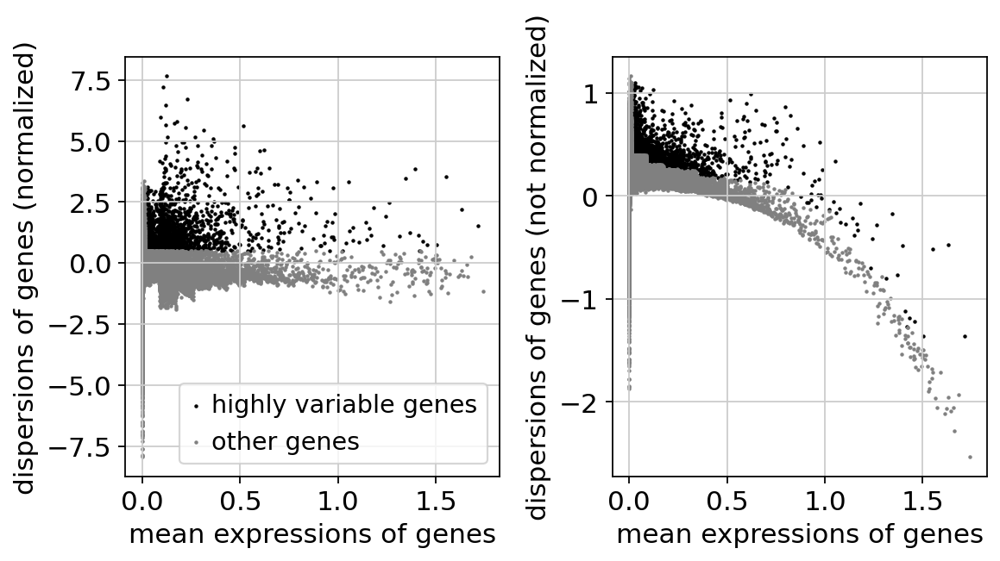

In [25]:
cellcycle_adata = adata.copy()
# Extract highly variable genes
filter_result = sc.pp.filter_genes_dispersion(
    cellcycle_adata.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.filter_genes_dispersion(filter_result,save='_ccg_identification.pdf')

In [26]:
# Traspose matrix for a GENE-centered analysis
cellcycle_adata = cellcycle_adata.T
cellcycle_adata = cellcycle_adata[filter_result.gene_subset,:]


In [27]:
%%time
# Scale data to unit variance and zero mean
sc.pp.scale(cellcycle_adata, max_value=10)
# Scatter plot in PCA coordinates
sc.tl.pca(cellcycle_adata, n_comps=30)

/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=30
    finished (0:00:11)
CPU times: user 1min 13s, sys: 1min 26s, total: 2min 40s
Wall time: 16.7 s


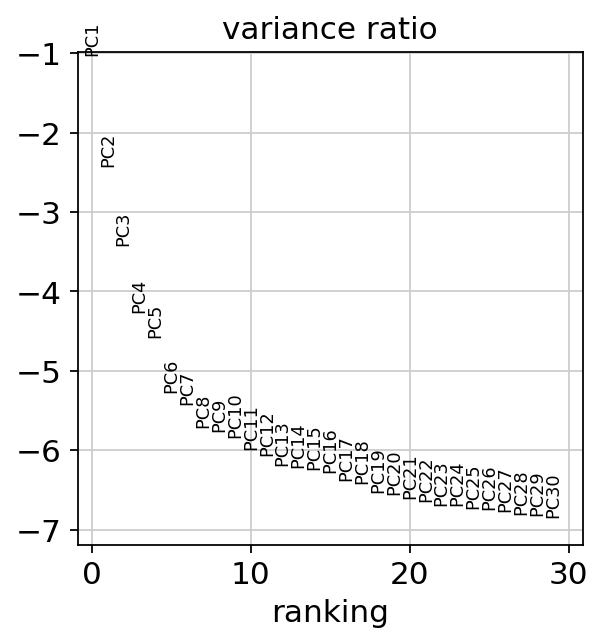

In [28]:
# Plot the variance ratio
sc.pl.pca_variance_ratio(cellcycle_adata, log=True, save='_ccg_identification.pdf')

computing neighbors
    using 'X_pca' with n_pcs = 8
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


... storing 'donor' as categorical


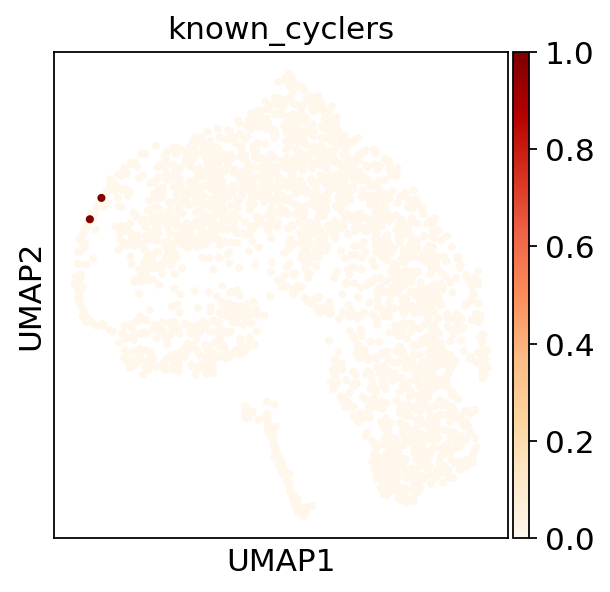

In [29]:
# Identify genes behaving like cc genes
num_pcs = 8
# Compute a neighborhood graph of observations
sc.pp.neighbors(cellcycle_adata,n_pcs=num_pcs)
# Embed the neighborhood graph using UMAP
sc.tl.umap(cellcycle_adata)
cellcycle_adata.obs['known_cyclers'] = [i in ['CDK1','MKI67','CCNB2','PCNA'] for i in cellcycle_adata.obs_names]
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers'],color_map='OrRd',save='_ccg_identification.pdf')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)


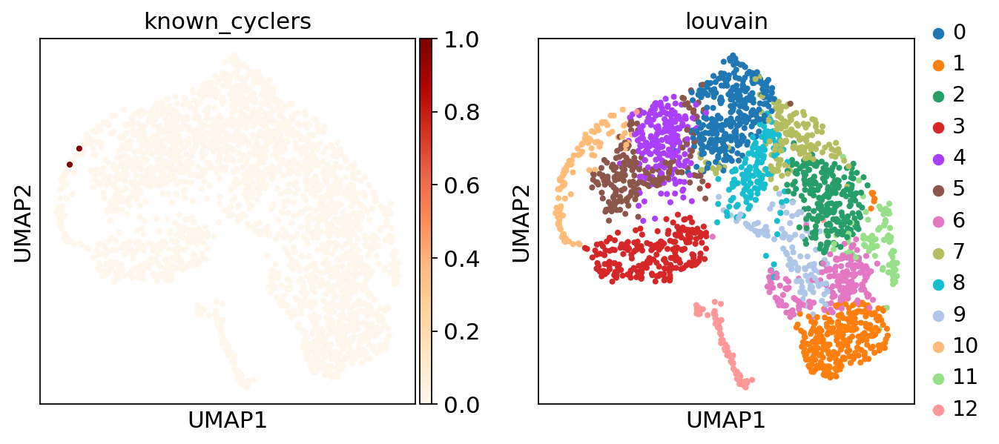

In [30]:
# Cluster GENES into subgroups using louvain
sc.tl.louvain(cellcycle_adata, resolution=1.0)
cellcycle_adata.obs['known_cyclers'] = [i in ['CDK1','MKI67','CCNB2','PCNA'] for i in cellcycle_adata.obs_names]
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers',
                                  'louvain'],color_map='OrRd',save='_ccg_identification.pdf')

In [31]:
# Locate genes of interests' cluster
print(cellcycle_adata.obs.loc[['CDK1','MKI67','CCNB2','PCNA'],'louvain'])


index
CDK1     NaN
MKI67     10
CCNB2    NaN
PCNA      10
Name: louvain, dtype: category
Categories (13, object): [0, 1, 2, 3, ..., 9, 10, 11, 12]


/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:961: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#deprecate-loc-reindex-listlike
  return getattr(section, self.name)[new_key]


In [32]:
adata

AnnData object with n_obs × n_vars = 107050 × 21557
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'
    uns: 'log1p'

So removing genes from cluster 10 by filtering the main matrix

In [33]:
# Add unstructured dict-like annotation for ccgs
adata.uns['ccgs'] = list(cellcycle_adata.obs[(cellcycle_adata.obs['louvain']=='10')].index)
# Remove cc genes
adata = adata[:,[i not in adata.uns['ccgs'] for i in adata.var_names]]


In [34]:
adata

View of AnnData object with n_obs × n_vars = 107050 × 21454
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'
    uns: 'log1p', 'ccgs'

In [35]:
%%time
# Assign cell cycle stage & scores
cell_cycle_genes = [x.strip() for x in open(file='/home/jovyan/notebooks/Vento_Lab/regev_lab_cell_cycle_genes_from_Luz_20200505.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
s_genes = [x for x in s_genes if x in adata.var_names]
g2m_genes = [x for x in g2m_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

# takes a few minutes

calculating cell cycle phase
computing score 'S_score'


Trying to set attribute `.obs` of view, copying.


    finished: added
    'S_score', score of gene set (adata.obs).
    387 total control genes are used. (0:00:05)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    467 total control genes are used. (0:00:03)
-->     'phase', cell cycle phase (adata.obs)
CPU times: user 6.23 s, sys: 2.28 s, total: 8.52 s
Wall time: 8.52 s


In [36]:
adata

AnnData object with n_obs × n_vars = 107050 × 21454
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8'
    uns: 'log1p', 'ccgs'

_______________________________________________________________________________________________________

In [37]:
samples = list(np.unique(adata.obs['sample']))
samples

['35008_CV005_RV9039258_and_35008_CV005_RV9039282',
 '35008_CV005_RV9039259_and_35008_CV005_RV9039283',
 '35008_CV005_RV9039260_and_35008_CV005_RV9039284',
 '35008_CV005_RV9039261_and_35008_CV005_RV9039285',
 '35008_CV005_RV9039262_and_35008_CV005_RV9039286',
 '35008_CV005_RV9039263_and_35008_CV005_RV9039287',
 '35171_CV005_RV9039361',
 '35171_CV005_RV9039362',
 '35171_CV005_RV9039363']

In [38]:
# subsetting to a certain sample in the new dictionary of per sample adatas
adatas = {}

for sample in samples:
    print(sample)
    adatas[sample] = adata[adata.obs['sample'] == sample].copy()

35008_CV005_RV9039258_and_35008_CV005_RV9039282
35008_CV005_RV9039259_and_35008_CV005_RV9039283
35008_CV005_RV9039260_and_35008_CV005_RV9039284
35008_CV005_RV9039261_and_35008_CV005_RV9039285
35008_CV005_RV9039262_and_35008_CV005_RV9039286
35008_CV005_RV9039263_and_35008_CV005_RV9039287
35171_CV005_RV9039361
35171_CV005_RV9039362
35171_CV005_RV9039363


# Subsetting to HVGs and scaling

In [39]:
%%time
for sample in samples:
    print(sample)
    sc.pp.highly_variable_genes(adatas[sample], min_mean=0.0125, max_mean=3, min_disp=0.5)

35008_CV005_RV9039258_and_35008_CV005_RV9039282
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
35008_CV005_RV9039259_and_35008_CV005_RV9039283
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
35008_CV005_RV9039260_and_35008_CV005_RV9039284
extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
35008_CV005_RV9039261_and_35008_CV005_RV9039285
extracting highly variable genes
    finished (0:00:01)
--> added
 

35008_CV005_RV9039258_and_35008_CV005_RV9039282


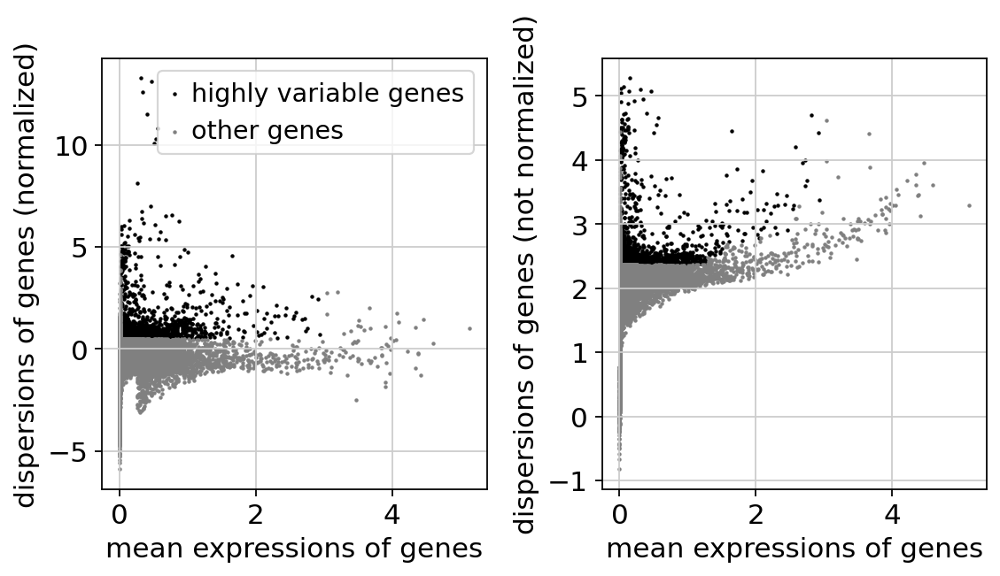

35008_CV005_RV9039259_and_35008_CV005_RV9039283


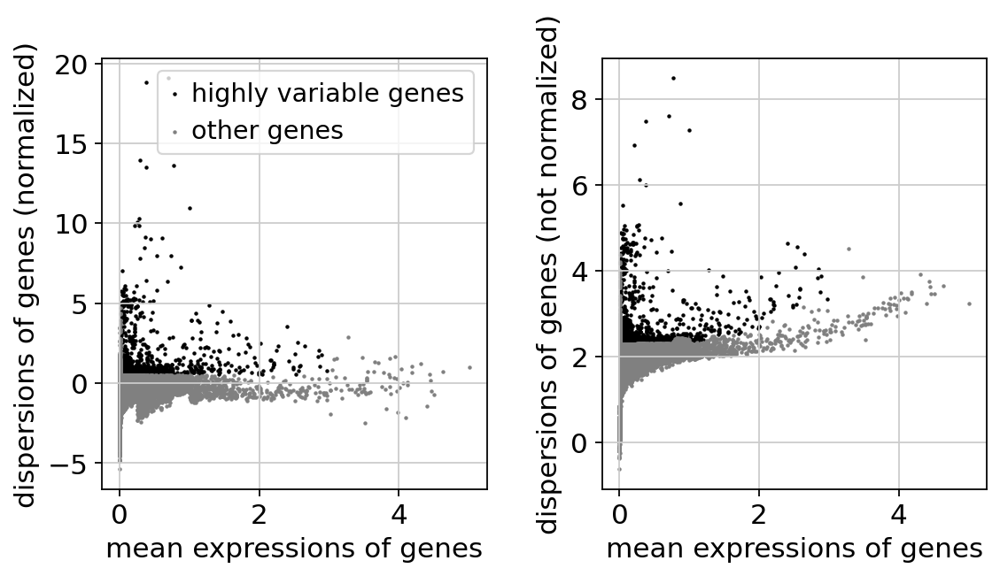

35008_CV005_RV9039260_and_35008_CV005_RV9039284


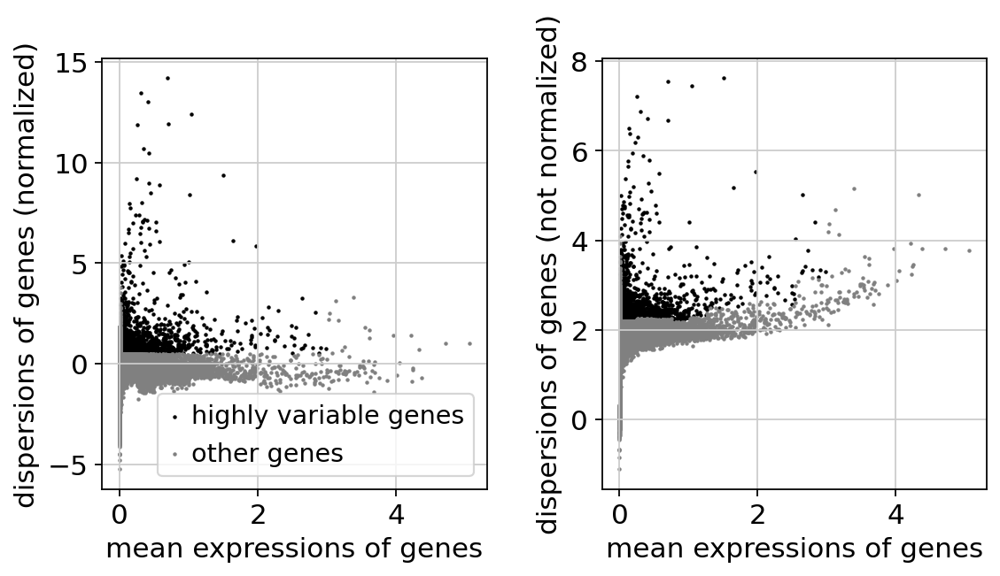

35008_CV005_RV9039261_and_35008_CV005_RV9039285


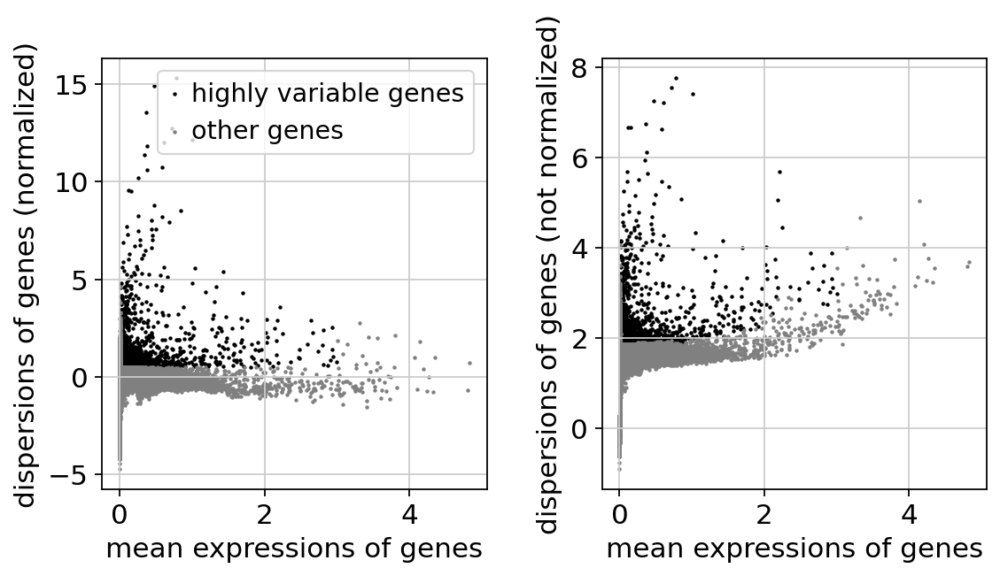

35008_CV005_RV9039262_and_35008_CV005_RV9039286


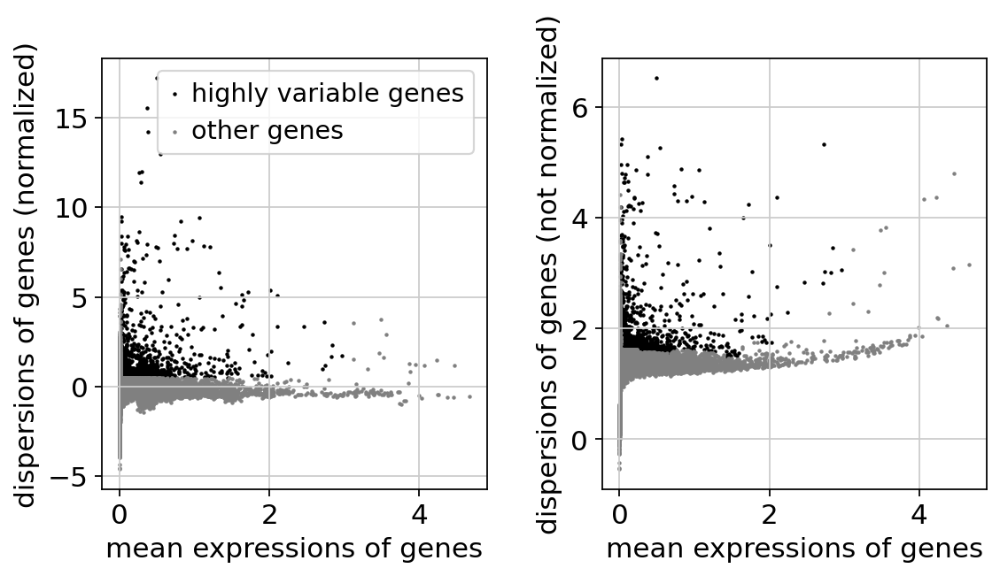

35008_CV005_RV9039263_and_35008_CV005_RV9039287


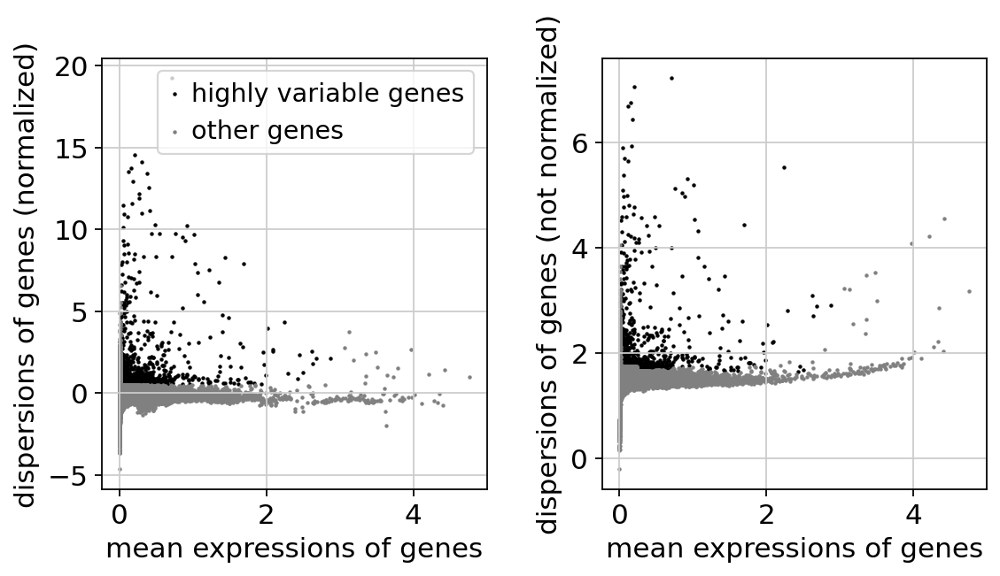

35171_CV005_RV9039361


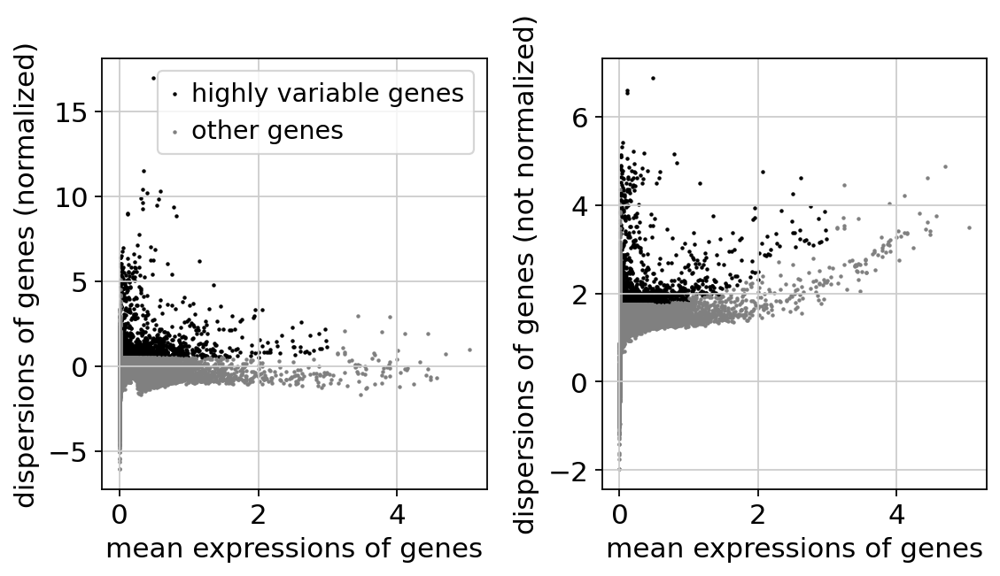

35171_CV005_RV9039362


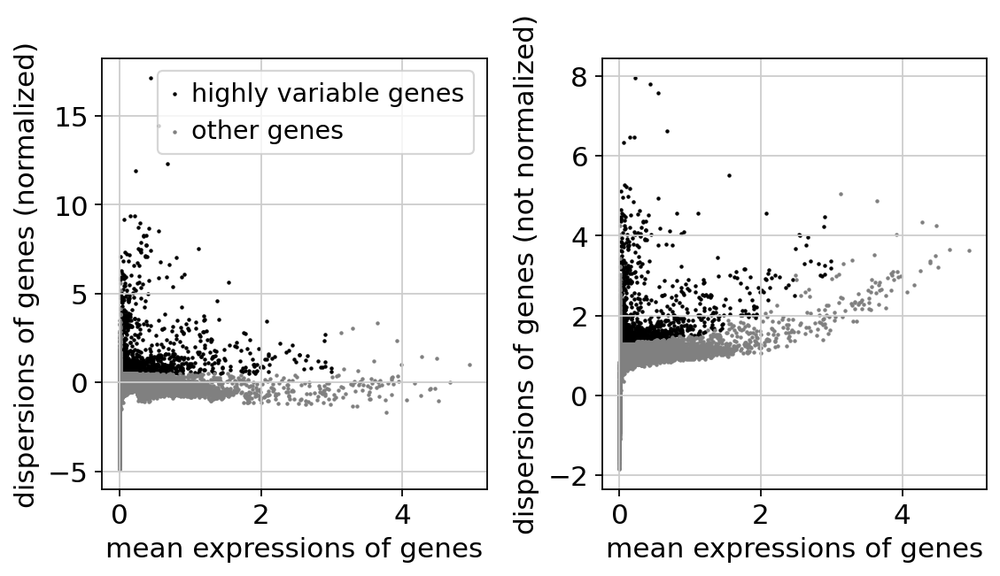

35171_CV005_RV9039363


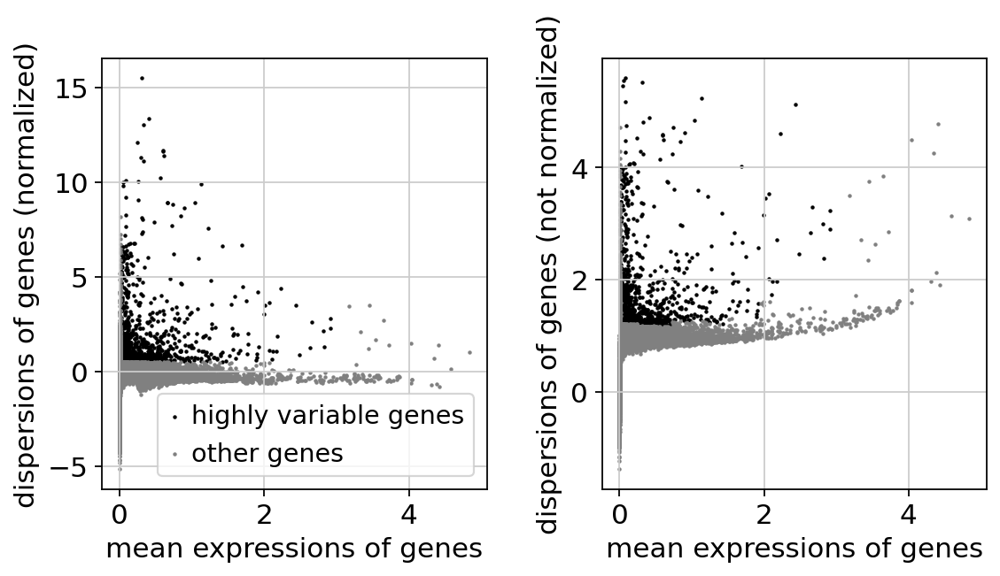

CPU times: user 5.32 s, sys: 0 ns, total: 5.32 s
Wall time: 5.33 s


In [40]:
%%time
for sample in samples:
    print(sample)
    sc.pl.highly_variable_genes(adatas[sample])

In [41]:
adatas_hvg = {}

for sample in samples:
    print(sample)
    adatas_hvg[sample] = adatas[sample][:, adatas[sample].var['highly_variable']]

35008_CV005_RV9039258_and_35008_CV005_RV9039282
35008_CV005_RV9039259_and_35008_CV005_RV9039283
35008_CV005_RV9039260_and_35008_CV005_RV9039284
35008_CV005_RV9039261_and_35008_CV005_RV9039285
35008_CV005_RV9039262_and_35008_CV005_RV9039286
35008_CV005_RV9039263_and_35008_CV005_RV9039287
35171_CV005_RV9039361
35171_CV005_RV9039362
35171_CV005_RV9039363


In [42]:
adatas_hvg['35008_CV005_RV9039258_and_35008_CV005_RV9039282']

View of AnnData object with n_obs × n_vars = 11881 × 2590
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'ccgs', 'hvg'

In [43]:
adatas_hvg['35008_CV005_RV9039259_and_35008_CV005_RV9039283']

View of AnnData object with n_obs × n_vars = 12565 × 2227
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'ccgs', 'hvg'

In [44]:
%%time
for sample in samples:
    print(sample)
    sc.pp.scale(adatas_hvg[sample], max_value=10)

35008_CV005_RV9039258_and_35008_CV005_RV9039282
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:806: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


35008_CV005_RV9039259_and_35008_CV005_RV9039283
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
35008_CV005_RV9039260_and_35008_CV005_RV9039284
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
35008_CV005_RV9039261_and_35008_CV005_RV9039285
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
35008_CV005_RV9039262_and_35008_CV005_RV9039286
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
35008_CV005_RV9039263_and_35008_CV005_RV9039287
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
35171_CV005_RV9039361
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
35171_CV005_RV9039362
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
35171_CV005_RV9039363
... as `zero_center=True`, sparse in

________

## PCA

In [45]:
%%time
for sample in samples:
    print(sample)
    sc.tl.pca(adatas_hvg[sample], svd_solver='arpack', n_comps=50)

35008_CV005_RV9039258_and_35008_CV005_RV9039282
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:05)
35008_CV005_RV9039259_and_35008_CV005_RV9039283
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)
35008_CV005_RV9039260_and_35008_CV005_RV9039284
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:06)
35008_CV005_RV9039261_and_35008_CV005_RV9039285
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)
35008_CV005_RV9039262_and_35008_CV005_RV9039286
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)
35008_CV005_RV9039263_and_35008_CV005_RV9039287
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:02)
35171_CV005_RV9039361
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:06)
35171_CV005_RV9039362
computing PCA
    on highly variable genes
    with n_comps=50
   

35008_CV005_RV9039258_and_35008_CV005_RV9039282


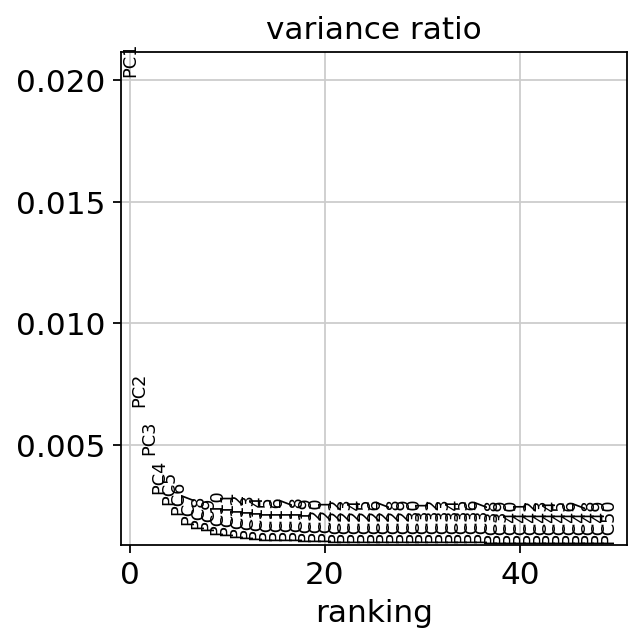

35008_CV005_RV9039259_and_35008_CV005_RV9039283


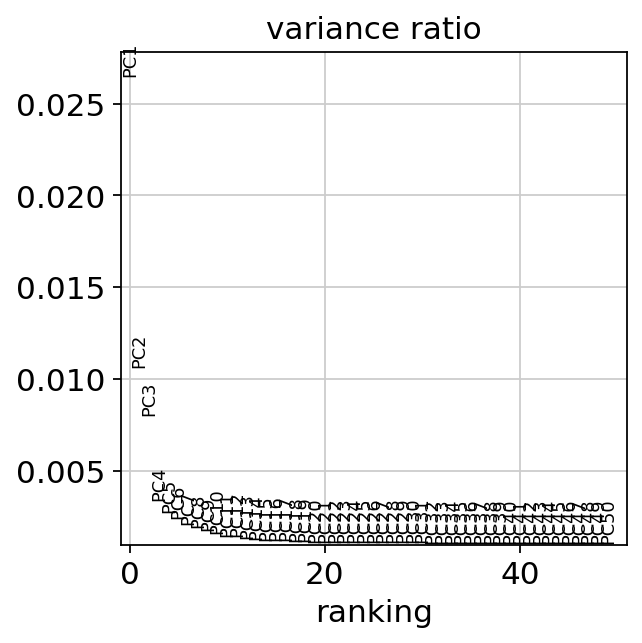

35008_CV005_RV9039260_and_35008_CV005_RV9039284


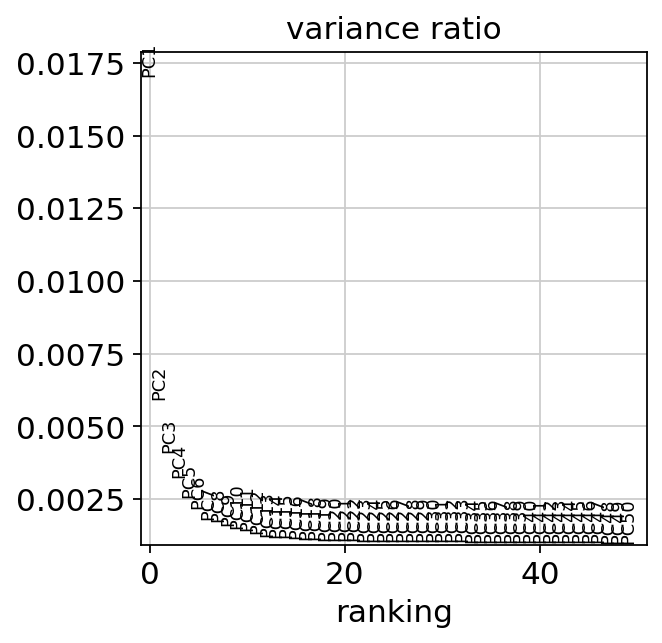

35008_CV005_RV9039261_and_35008_CV005_RV9039285


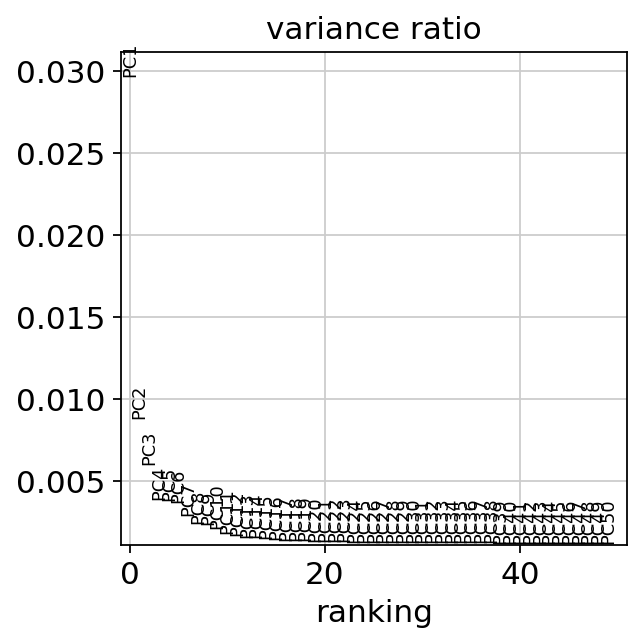

35008_CV005_RV9039262_and_35008_CV005_RV9039286


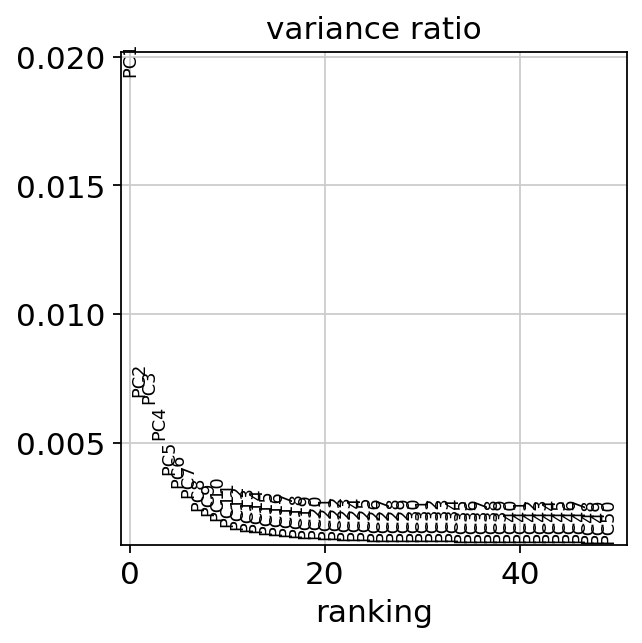

35008_CV005_RV9039263_and_35008_CV005_RV9039287


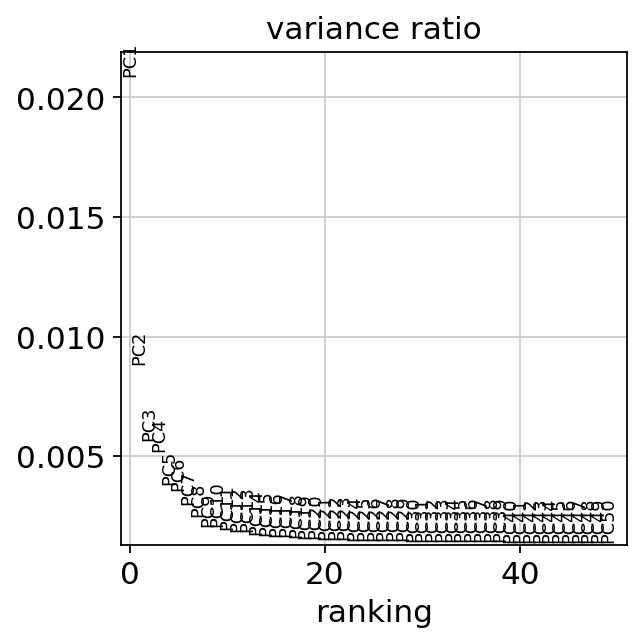

35171_CV005_RV9039361


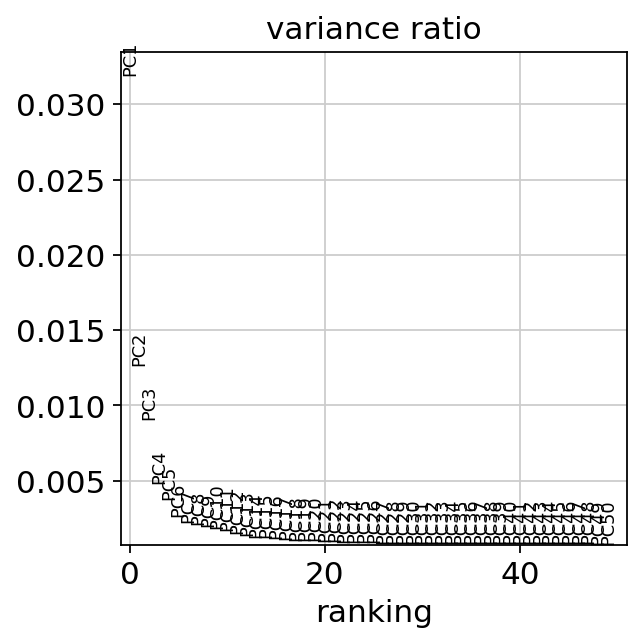

35171_CV005_RV9039362


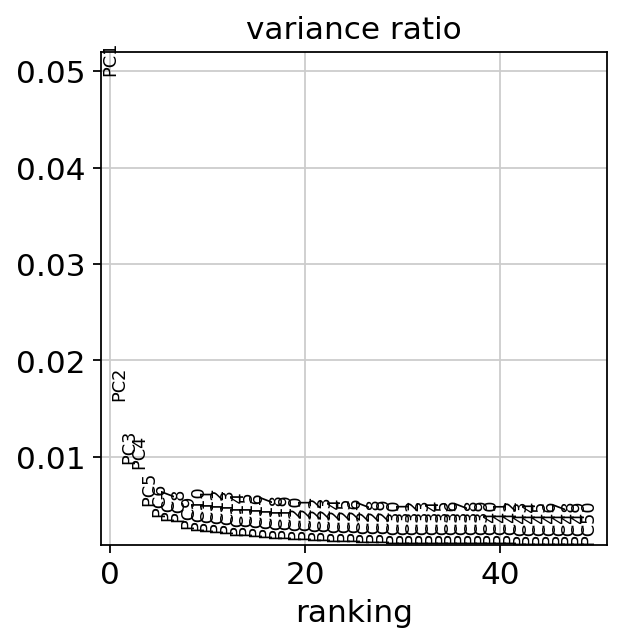

35171_CV005_RV9039363


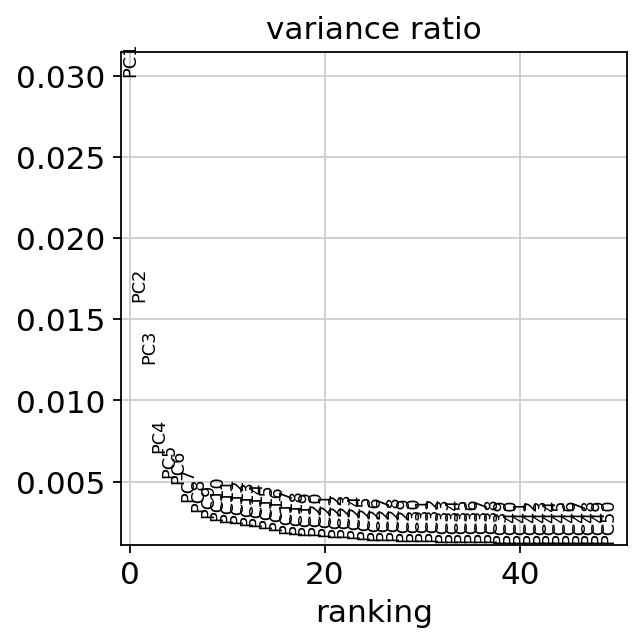

In [46]:
for sample in samples:
    print(sample)
    sc.pl.pca_variance_ratio(adatas_hvg[sample], n_pcs=50)

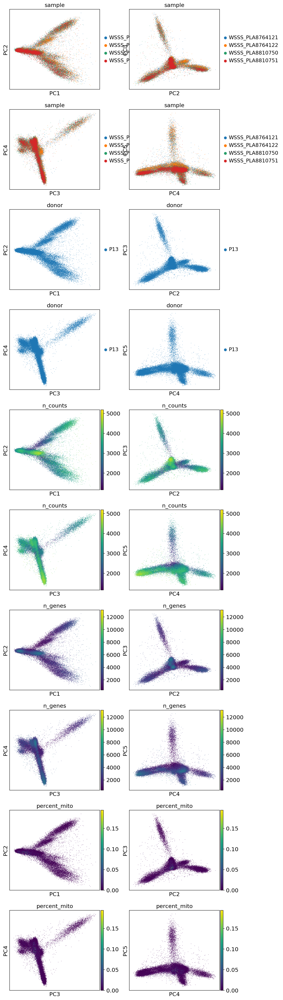

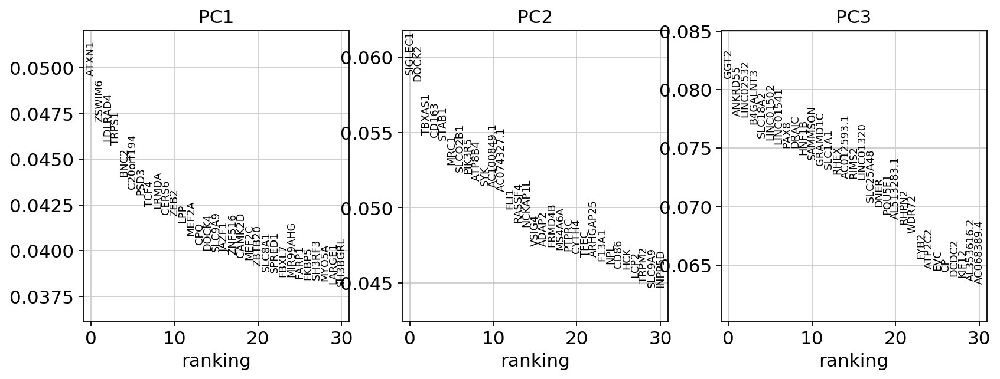

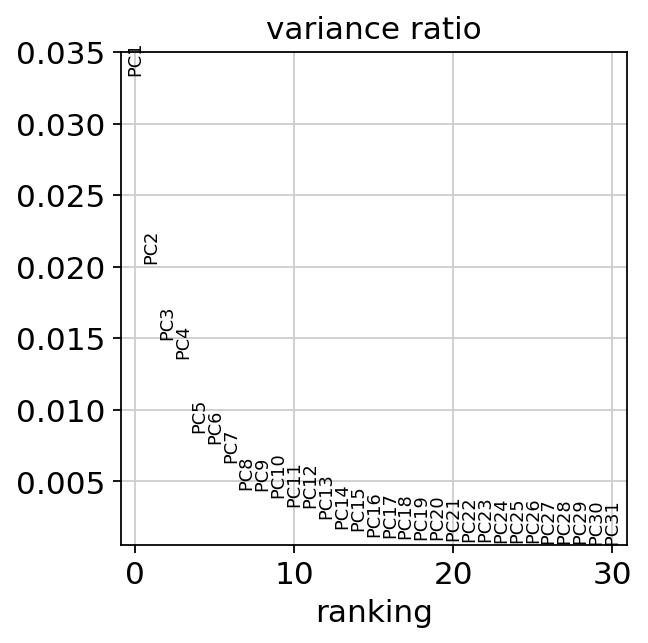

In [56]:
sc.pl.pca_overview(adata_hvg, color = ['sample', 'donor', 'n_counts', 'n_genes', 
                                    'percent_mito'], components = ['1,2', '2,3', '3,4', '4,5'], ncols = 2)

__________________________________________________________________________________________________________________________________________________________________

### Neighbourhood graph & UMAP

__________________________________________________________________________________________________________________________________________________________________

In [47]:
%%time
for sample in samples:
    print(sample)
    sc.pp.neighbors(adatas_hvg[sample], n_neighbors=10, n_pcs=20)

35008_CV005_RV9039258_and_35008_CV005_RV9039282
computing neighbors
    using 'X_pca' with n_pcs = 20


/opt/conda/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../../opt/conda/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/opt/conda/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../../opt/conda/lib/python3.7/site-packages/uma

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)
35008_CV005_RV9039259_and_35008_CV005_RV9039283
computing neighbors
    using 'X_pca' with n_pcs = 20


/opt/conda/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../../opt/conda/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
35008_CV005_RV9039260_and_35008_CV005_RV9039284
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
35008_CV005_RV9039261_and_35008_CV005_RV9039285
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
35008_CV005_RV9039262_and_35008_CV005_RV9039286
computing neighbors
    using 'X_pca' with n_pcs = 20


/opt/conda/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../../opt/conda/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
35008_CV005_RV9039263_and_35008_CV005_RV9039287
computing neighbors
    using 'X_pca' with n_pcs = 20


/opt/conda/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../../opt/conda/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
35171_CV005_RV9039361
computing neighbors
    using 'X_pca' with n_pcs = 20


/opt/conda/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../../opt/conda/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
35171_CV005_RV9039362
computing neighbors
    using 'X_pca' with n_pcs = 20


/opt/conda/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../../opt/conda/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
35171_CV005_RV9039363
computing neighbors
    using 'X_pca' with n_pcs = 20


/opt/conda/lib/python3.7/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../../opt/conda/lib/python3.7/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
CPU times: user 32.1 s, sys: 21.1 s, total: 53.2 s
Wall time: 26.9 s


__________________________________________________________________________________________________________________________________________________________________

In [48]:
%%time
for sample in samples:
    print(sample)
    sc.tl.umap(adatas_hvg[sample], random_state=0)

35008_CV005_RV9039258_and_35008_CV005_RV9039282
computing UMAP


/opt/conda/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)
35008_CV005_RV9039259_and_35008_CV005_RV9039283
computing UMAP


/opt/conda/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)
35008_CV005_RV9039260_and_35008_CV005_RV9039284
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)
35008_CV005_RV9039261_and_35008_CV005_RV9039285
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)
35008_CV005_RV9039262_and_35008_CV005_RV9039286
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)
35008_CV005_RV9039263_and_35008_CV005_RV9039287
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:18)
35171_CV005_RV9039361
computing UMAP


/opt/conda/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)
35171_CV005_RV9039362
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)
35171_CV005_RV9039363
computing UMAP


/opt/conda/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)
CPU times: user 2min 27s, sys: 49.9 s, total: 3min 17s
Wall time: 2min 6s


# Plotting

In [49]:
adatas_hvg['35008_CV005_RV9039258_and_35008_CV005_RV9039282']

AnnData object with n_obs × n_vars = 11881 × 2590
    obs: 'batch', 'bh_pval', 'cell_id', 'dataset', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'stimulation', 'technique', 'is_doublet', 'donor', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7', 'gene_ids-8', 'feature_types-8', 'genome-8', 'n_cells-8', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'ccgs', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: '

In [50]:
markers = ['CD4','CD3G', 'FOXJ1', 'IL2R', 'TRDV2', 'CD8', # T cells
                             'CD19', 'MS4A1', # B cells
                              'CD27', 'CD38', 'JCHAIN', # Plasma B cells
                             'NCAM1', 'FCGR3A', # NK celss
                             'HBB', # Erythrocytes
                             'FCGR3B', # Neutrophils
                             'CD14', 'S100A12', # Monocytes
                             'FLT3', # Dendritic cells
                             'IRF4', 'CLEC9A', # cDC1
                             'CD1C', # cDC2
                             'TNFRSF21', # pDC and IRF4
                             'CD34', # Precursors
                             'PPBP', 'TUBB1', 'PF4', # Platelets
                             'MI67', # cycling
                            ]

### No batch correction

20 PCs

35008_CV005_RV9039258_and_35008_CV005_RV9039282


... storing 'donor' as categorical
... storing 'phase' as categorical


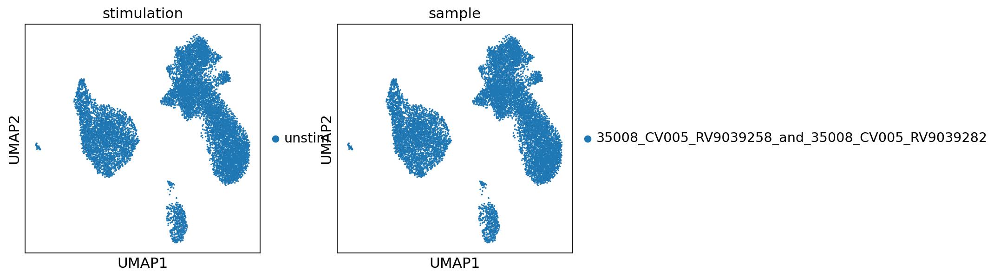

... storing 'donor' as categorical
... storing 'phase' as categorical


35008_CV005_RV9039259_and_35008_CV005_RV9039283


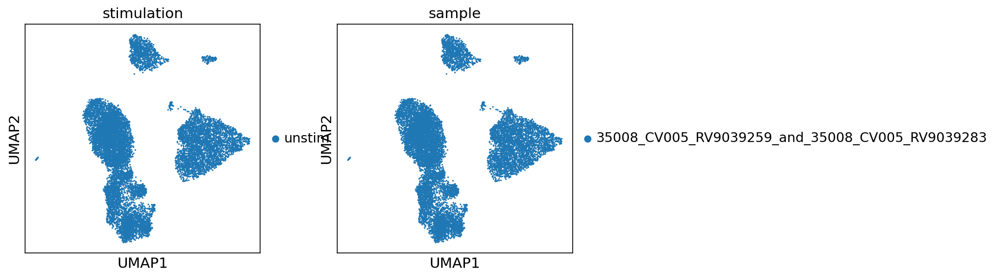

... storing 'donor' as categorical
... storing 'phase' as categorical


35008_CV005_RV9039260_and_35008_CV005_RV9039284


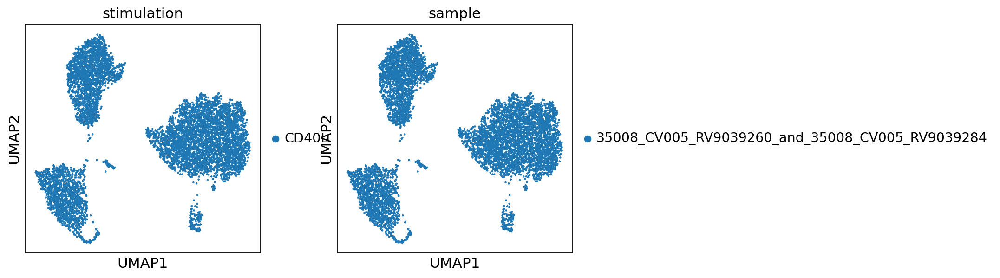

... storing 'donor' as categorical
... storing 'phase' as categorical


35008_CV005_RV9039261_and_35008_CV005_RV9039285


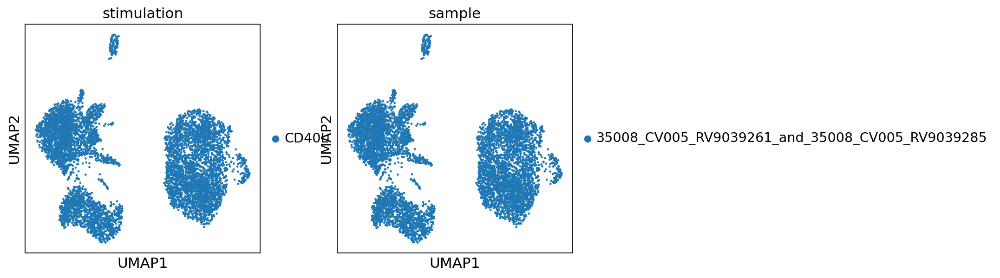

... storing 'donor' as categorical
... storing 'phase' as categorical


35008_CV005_RV9039262_and_35008_CV005_RV9039286


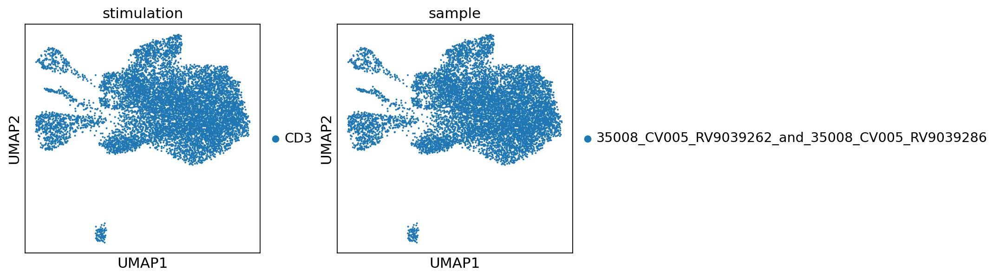

... storing 'donor' as categorical
... storing 'phase' as categorical


35008_CV005_RV9039263_and_35008_CV005_RV9039287


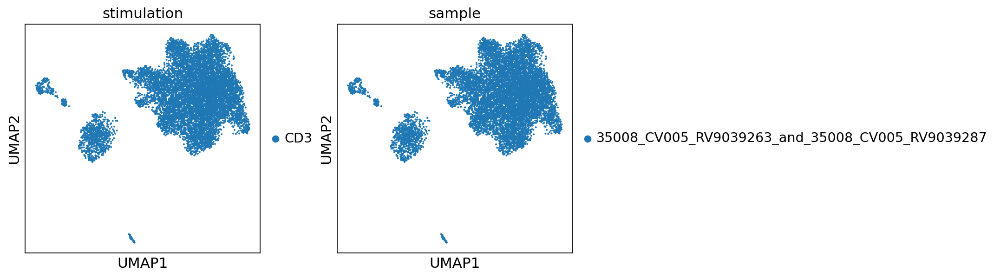

... storing 'donor' as categorical
... storing 'phase' as categorical


35171_CV005_RV9039361


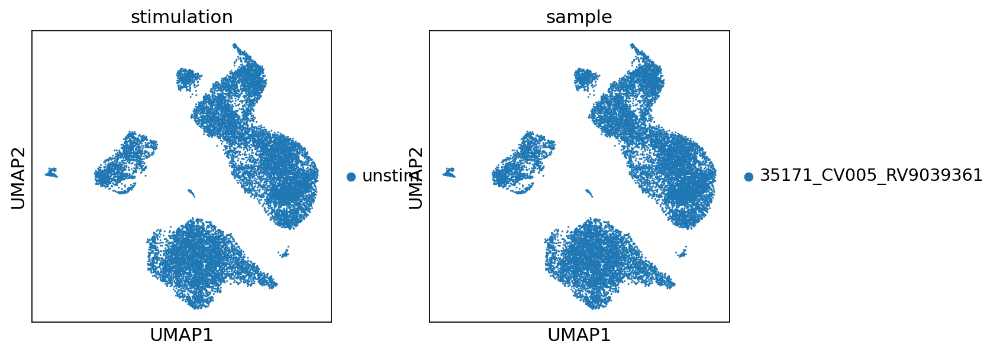

... storing 'donor' as categorical
... storing 'phase' as categorical


35171_CV005_RV9039362


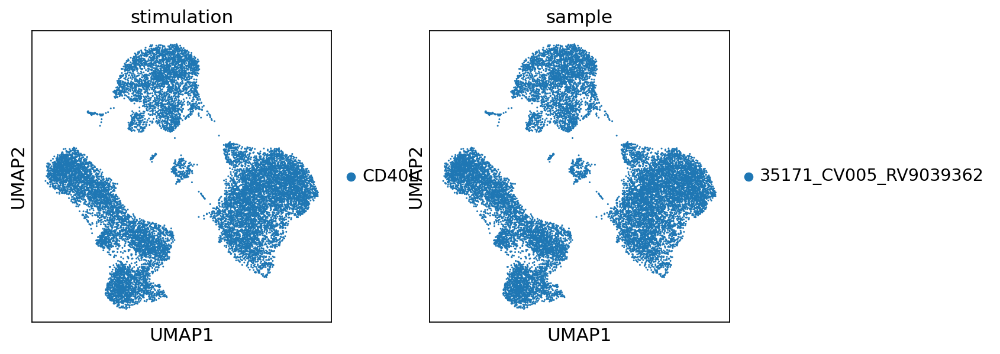

35171_CV005_RV9039363


... storing 'donor' as categorical
... storing 'phase' as categorical


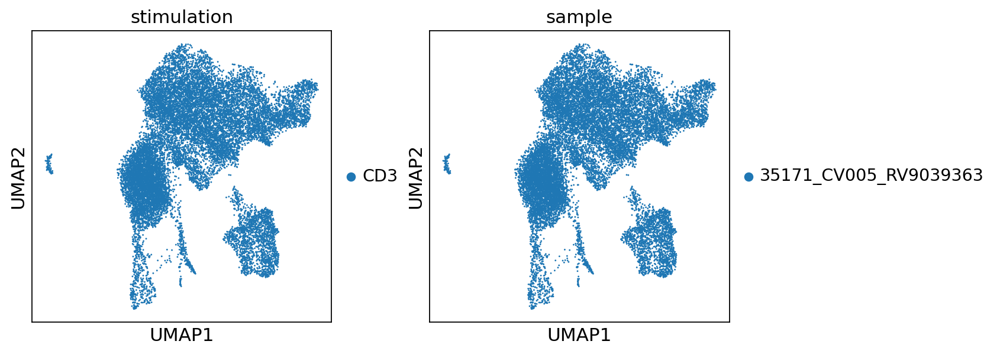

In [51]:
for sample in samples:
    print(sample)
    sc.pl.umap(adatas_hvg[sample], color=['stimulation','sample'])

35008_CV005_RV9039258_and_35008_CV005_RV9039282


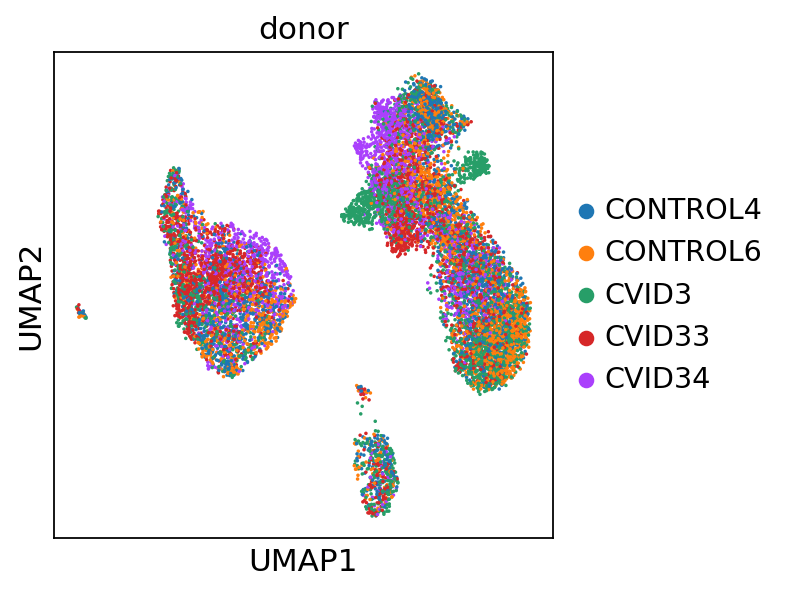

35008_CV005_RV9039259_and_35008_CV005_RV9039283


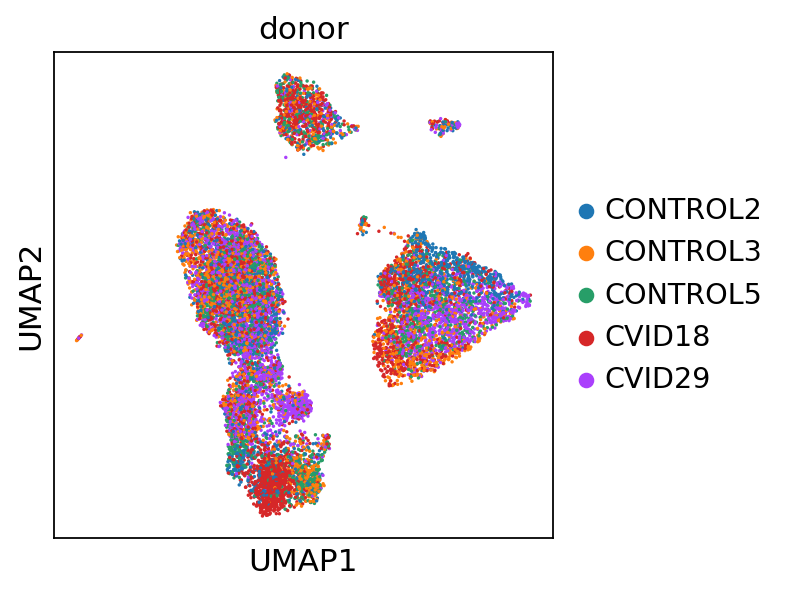

35008_CV005_RV9039260_and_35008_CV005_RV9039284


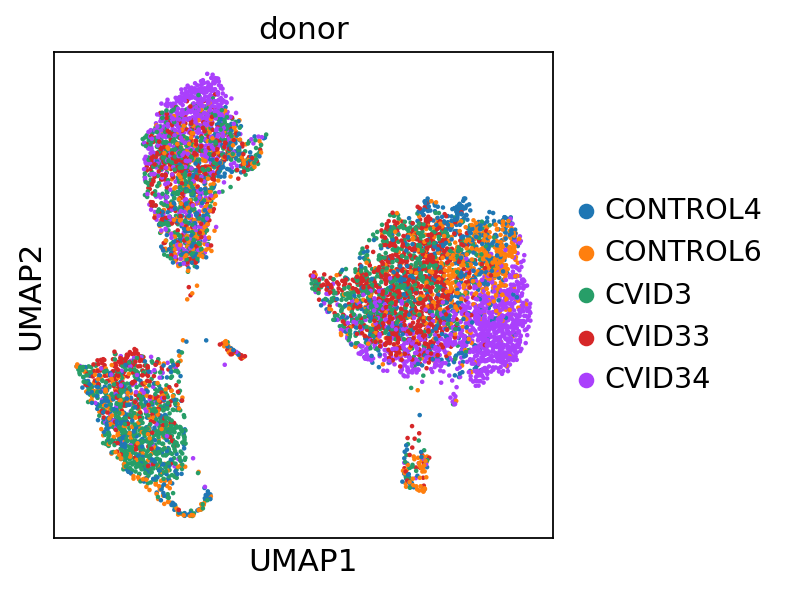

35008_CV005_RV9039261_and_35008_CV005_RV9039285


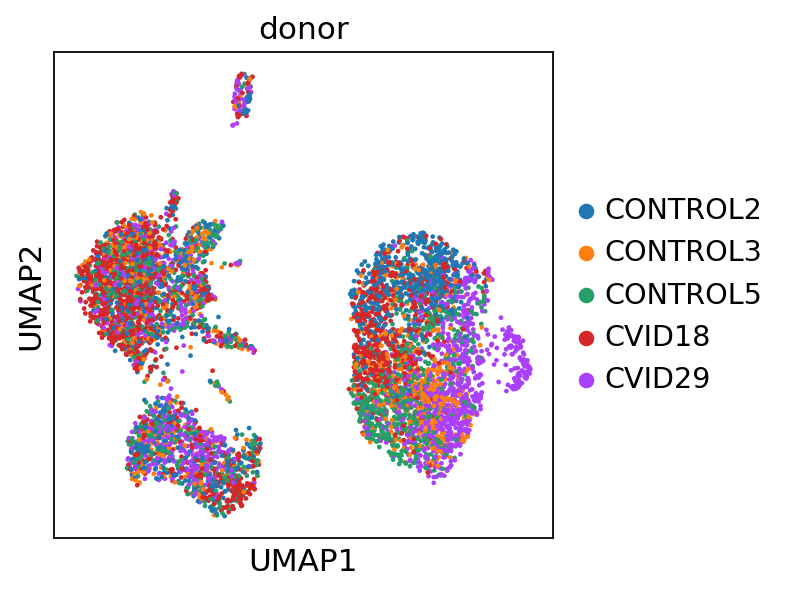

35008_CV005_RV9039262_and_35008_CV005_RV9039286


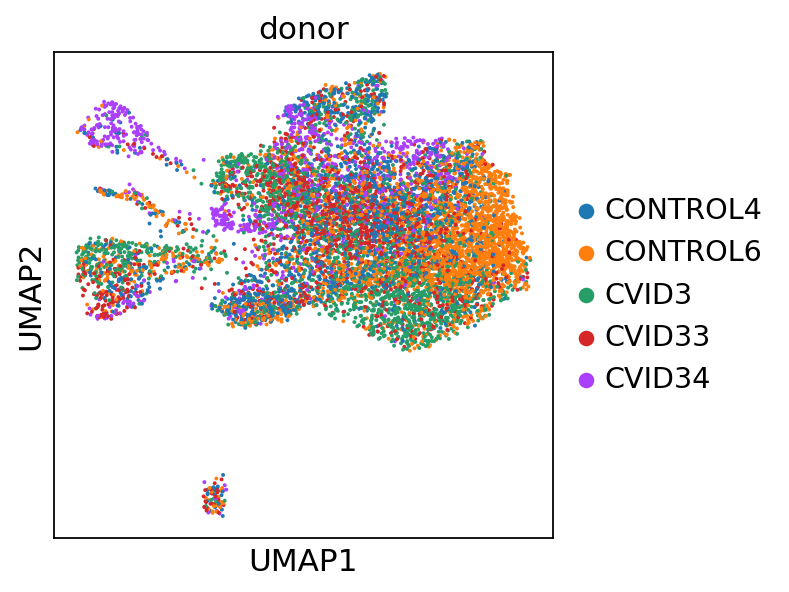

35008_CV005_RV9039263_and_35008_CV005_RV9039287


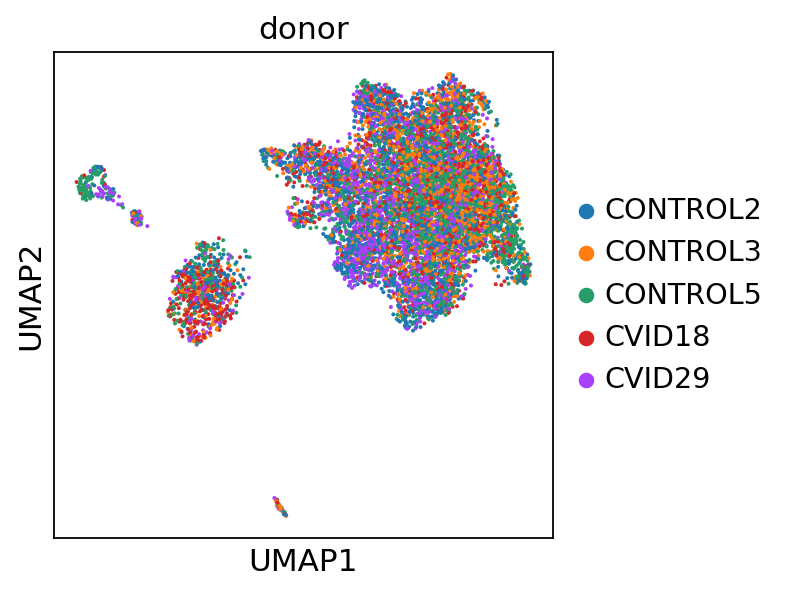

35171_CV005_RV9039361


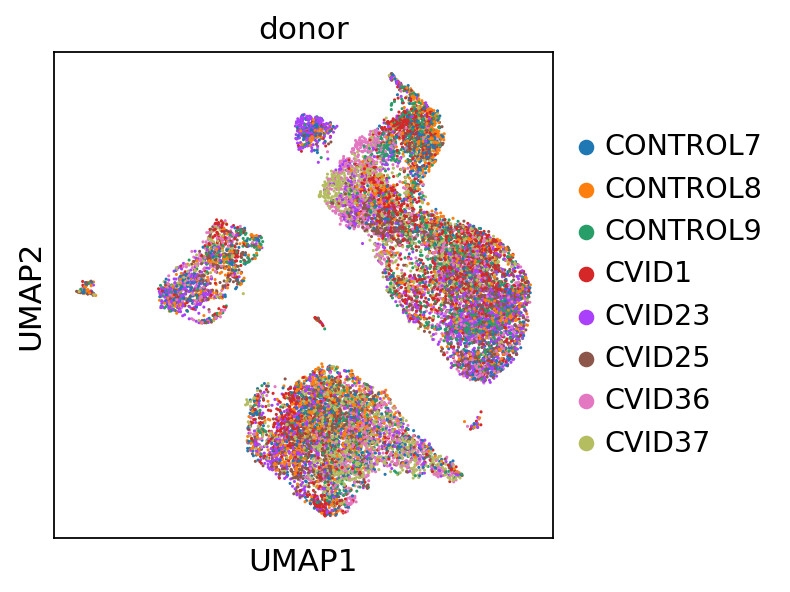

35171_CV005_RV9039362


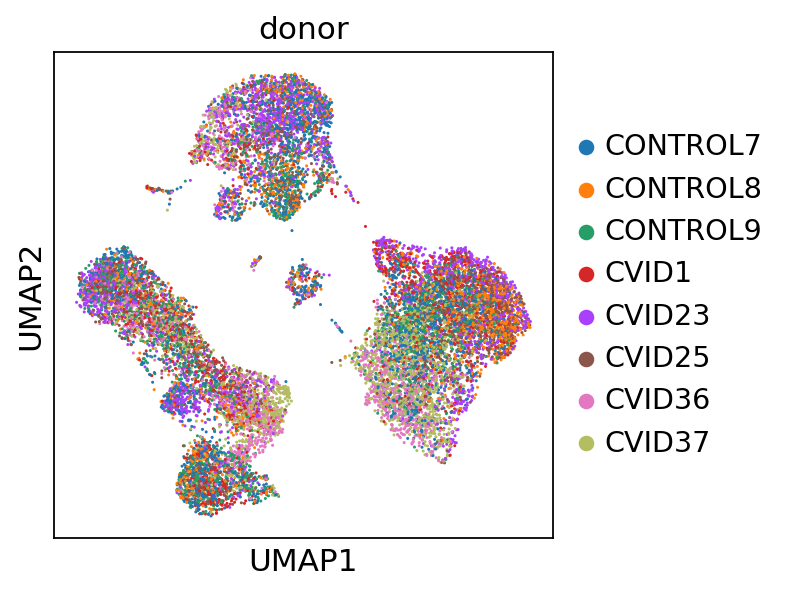

35171_CV005_RV9039363


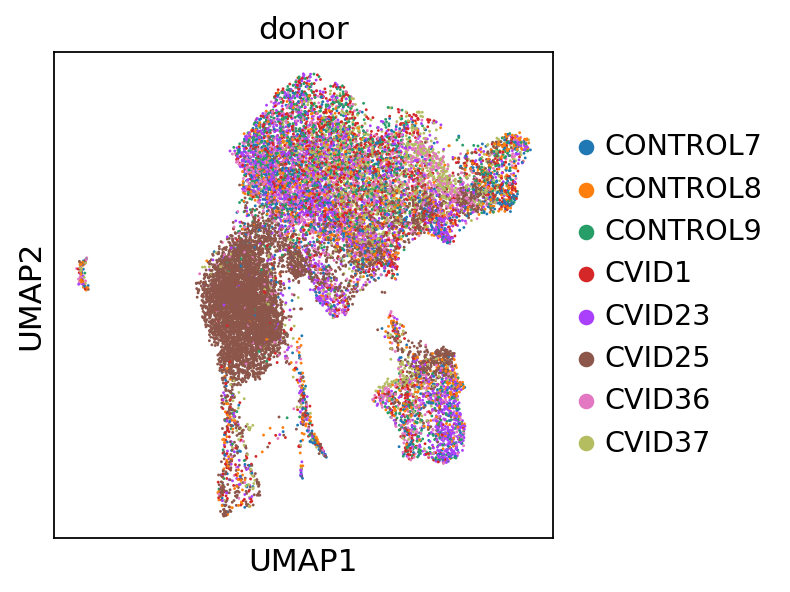

In [52]:
for sample in samples:
    print(sample)
    sc.pl.umap(adatas_hvg[sample], color=['donor'])

In [ ]:
for sample in samples:
    print(sample)
    sc.pl.umap(adatas_hvg[sample], color=['CD3D', # T cells
                             'CD19', # B cells
                             # NK markers
                             'NCAM1', # CD56
                             'FCGR3A', # CD16
                            ], ncols=3, use_raw=True, cmap='OrRd')

In [ ]:
for sample in samples:
    print(sample)
    sc.pl.umap(adatas_hvg[sample], color=['CDK1','MKI67','CCNB2','PCNA'], cmap='OrRd')

35008_CV005_RV9039258_and_35008_CV005_RV9039282


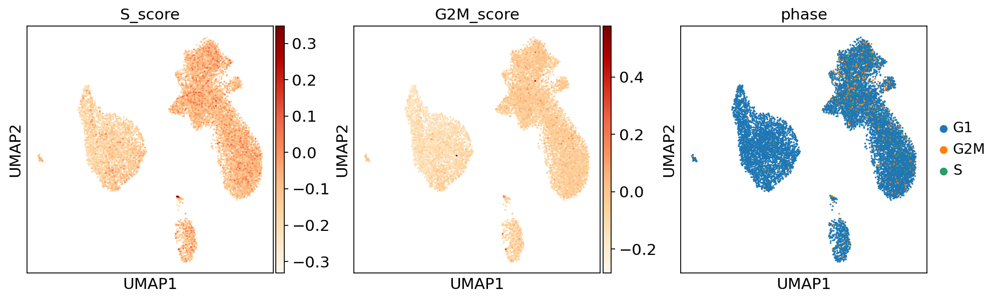

35008_CV005_RV9039259_and_35008_CV005_RV9039283


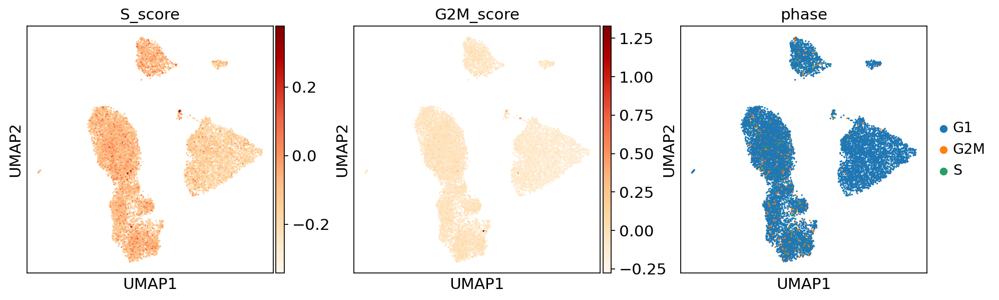

35008_CV005_RV9039260_and_35008_CV005_RV9039284


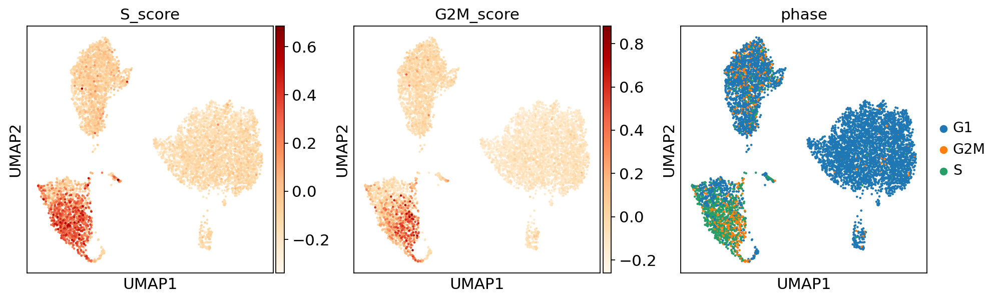

35008_CV005_RV9039261_and_35008_CV005_RV9039285


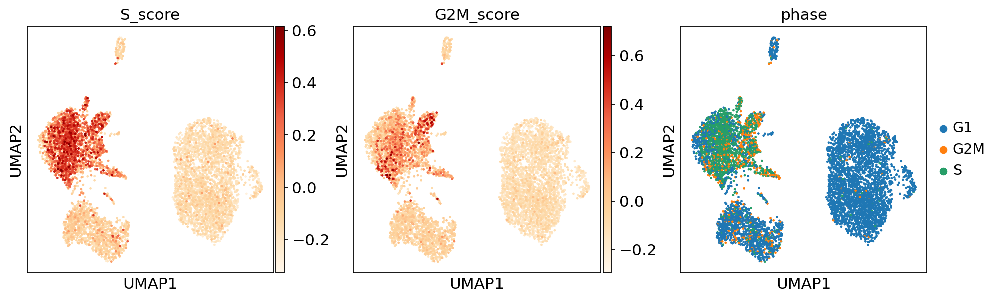

35008_CV005_RV9039262_and_35008_CV005_RV9039286


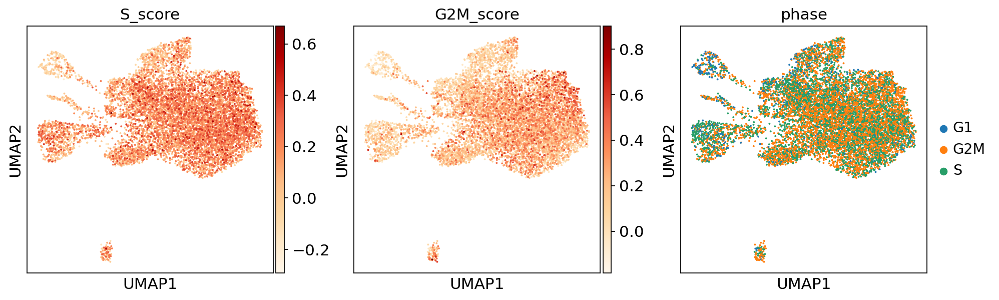

35008_CV005_RV9039263_and_35008_CV005_RV9039287


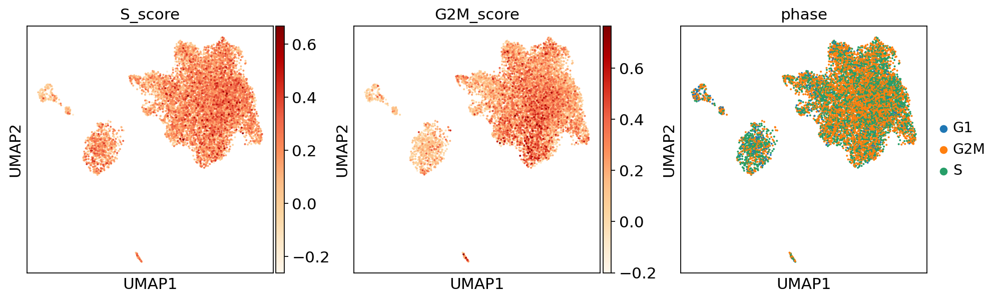

35171_CV005_RV9039361


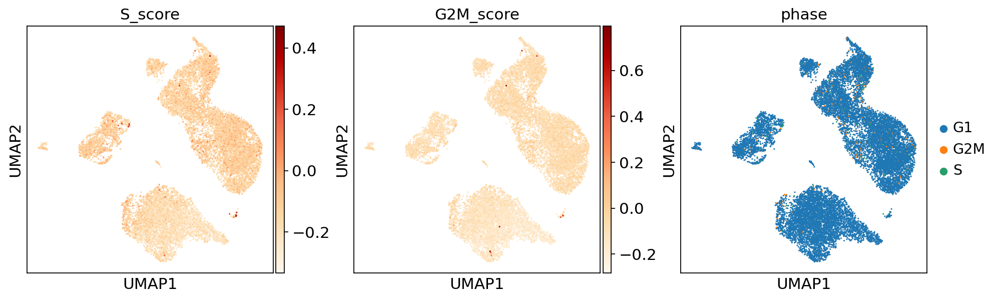

35171_CV005_RV9039362


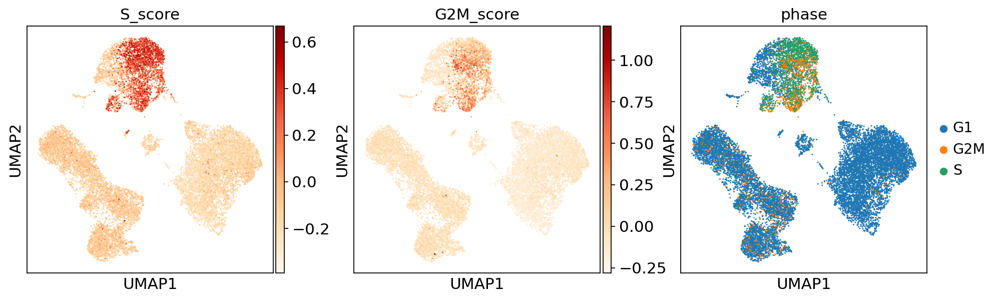

35171_CV005_RV9039363


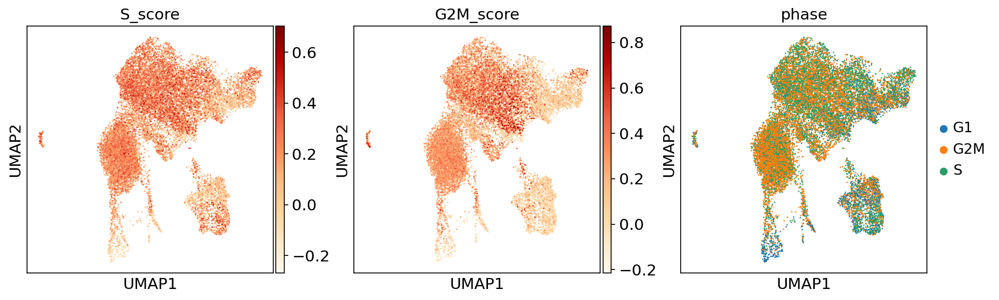

In [53]:
for sample in samples:
    print(sample)
    sc.pl.umap(adatas_hvg[sample], color=['S_score','G2M_score','phase'], cmap='OrRd')

35008_CV005_RV9039258_and_35008_CV005_RV9039282


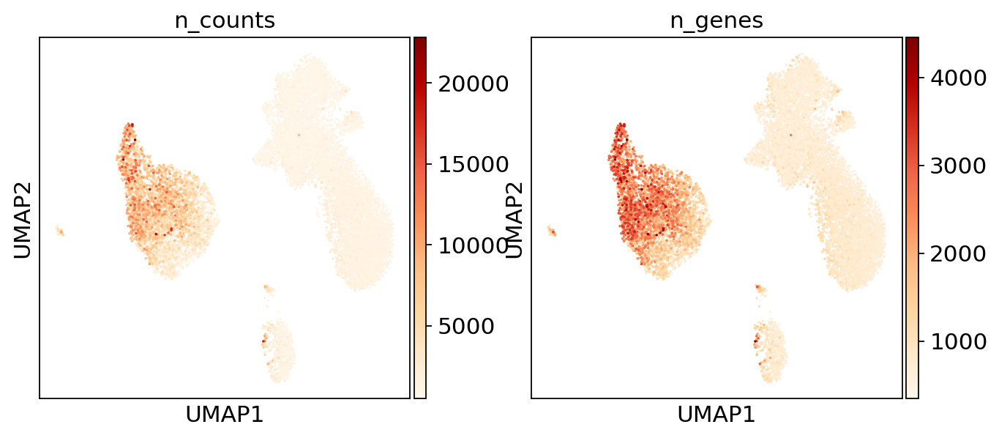

35008_CV005_RV9039259_and_35008_CV005_RV9039283


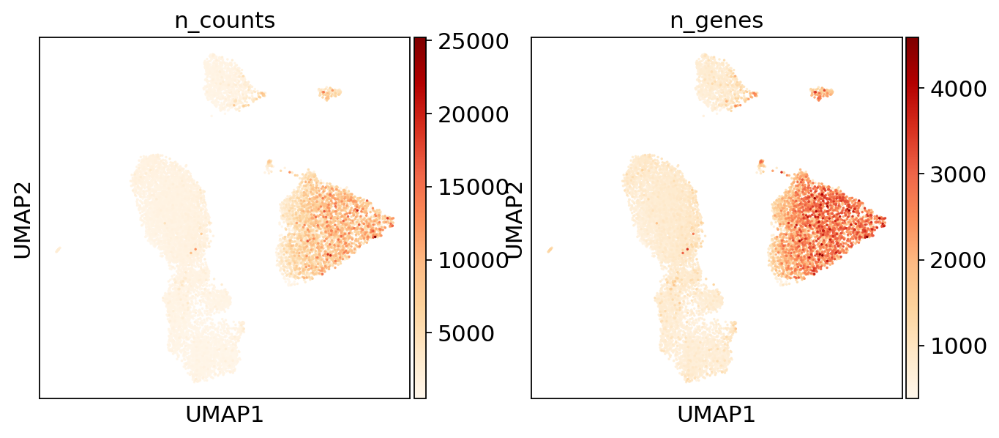

35008_CV005_RV9039260_and_35008_CV005_RV9039284


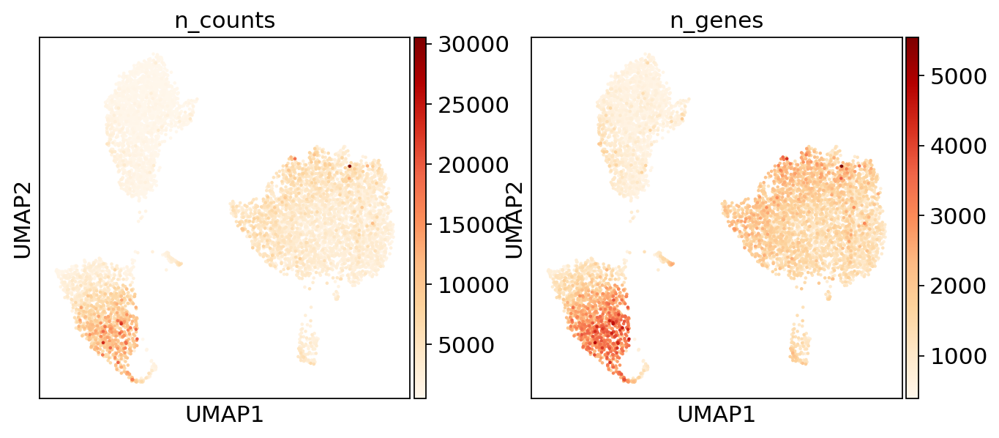

35008_CV005_RV9039261_and_35008_CV005_RV9039285


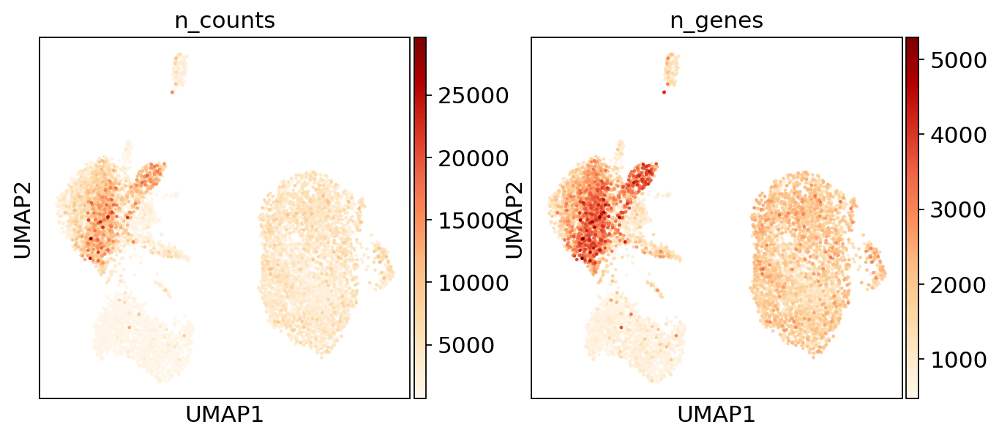

35008_CV005_RV9039262_and_35008_CV005_RV9039286


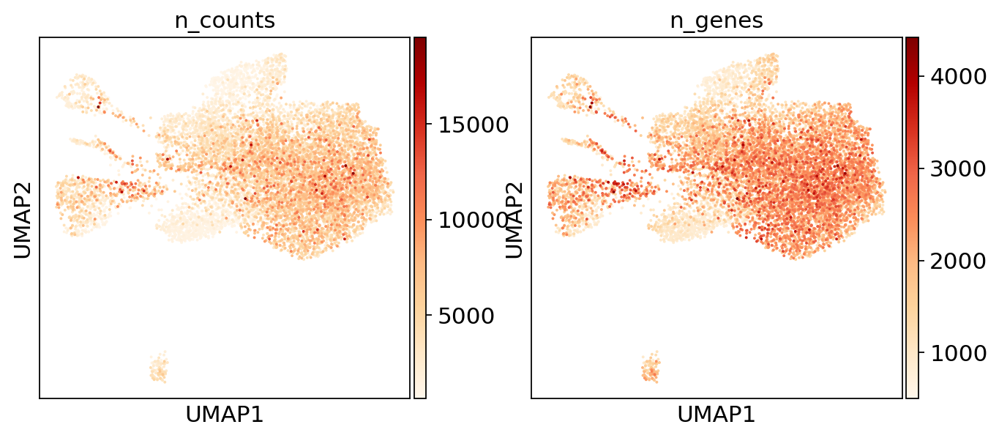

35008_CV005_RV9039263_and_35008_CV005_RV9039287


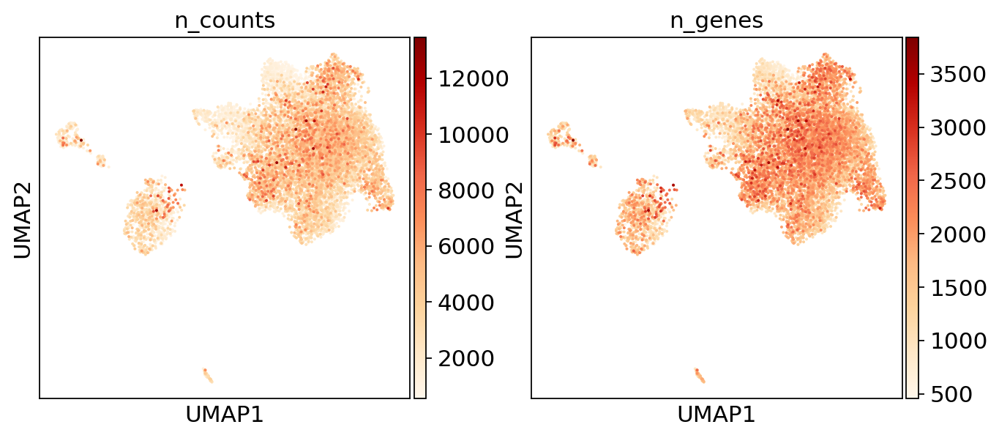

35171_CV005_RV9039361


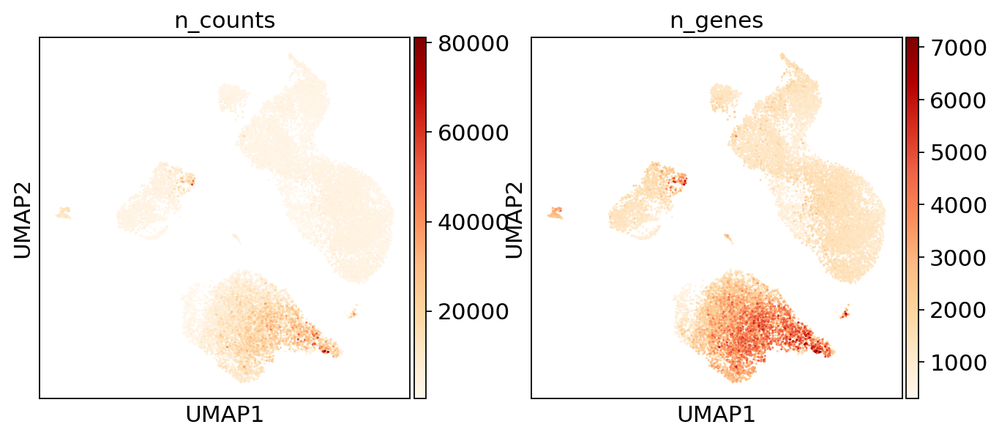

35171_CV005_RV9039362


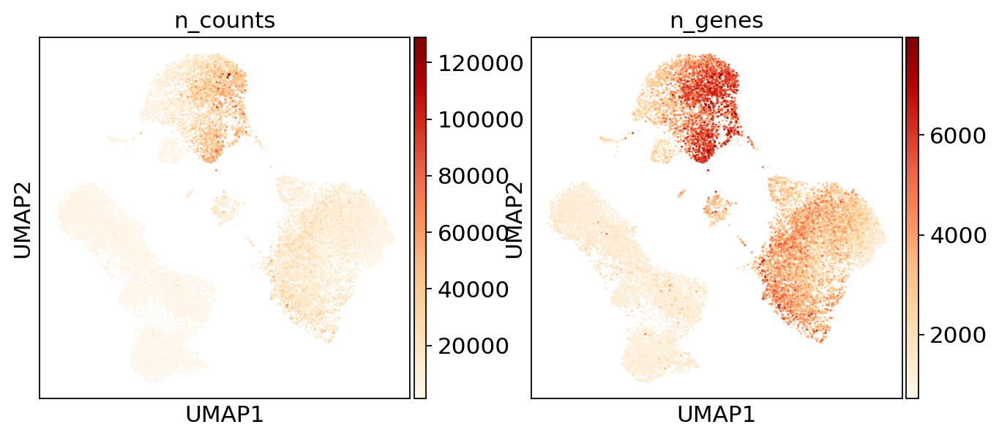

35171_CV005_RV9039363


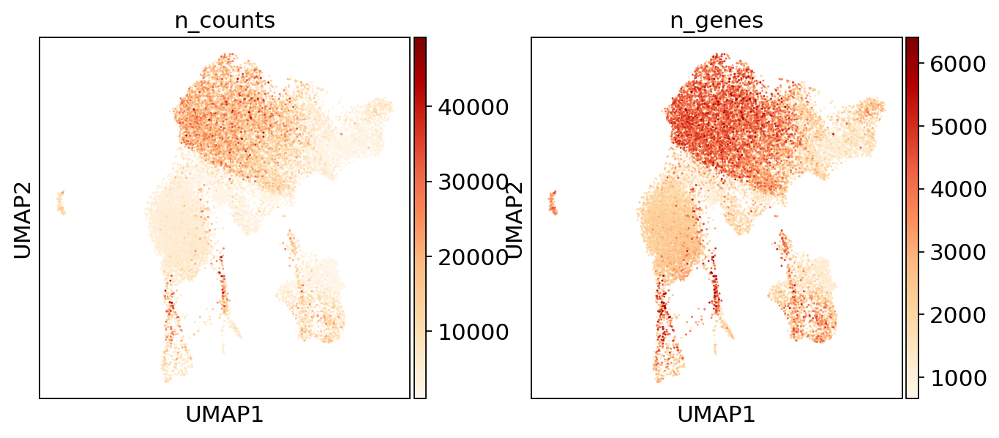

In [54]:
for sample in samples:
    print(sample)
    sc.pl.umap(adatas_hvg[sample], color=['n_counts',
                             'n_genes'], cmap='OrRd')

In [ ]:
for sample in samples:
    print(sample)
    sc.pl.umap(adatas_hvg[sample], color=[elem for elem in markers if elem in list(adatas_hvg[sample].raw.var.index)],
           use_raw=True, cmap='OrRd',
          ncols=5)

### Unbiased clustering

In [55]:
%%time
for sample in samples:
    print(sample)
    sc.tl.louvain(adatas_hvg[sample], resolution=1.0)

35008_CV005_RV9039258_and_35008_CV005_RV9039282
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:01)
35008_CV005_RV9039259_and_35008_CV005_RV9039283
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:01)
35008_CV005_RV9039260_and_35008_CV005_RV9039284
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 12 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
35008_CV005_RV9039261_and_35008_CV005_RV9039285
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 13 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
35008_CV005_RV9039262_and_35008_CV005_RV9039286
running Louvain 

35008_CV005_RV9039258_and_35008_CV005_RV9039282


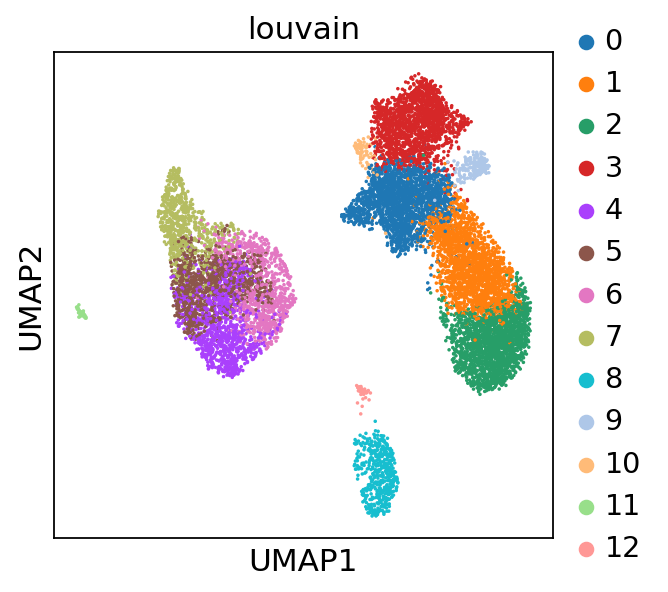

35008_CV005_RV9039259_and_35008_CV005_RV9039283


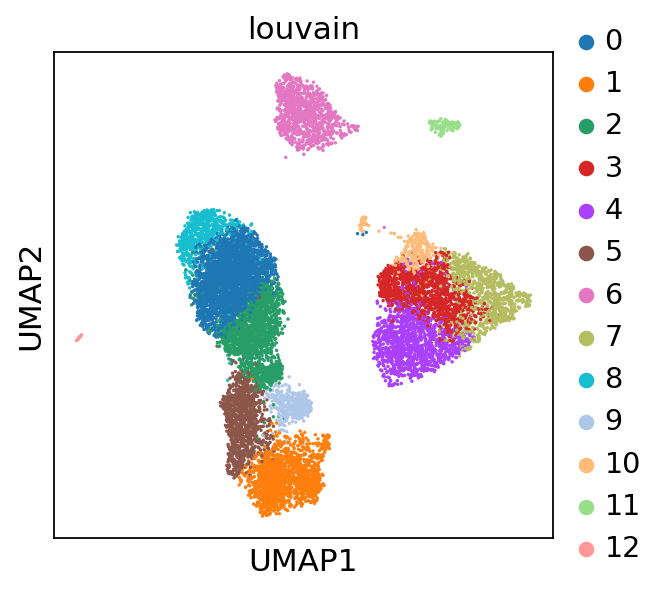

35008_CV005_RV9039260_and_35008_CV005_RV9039284


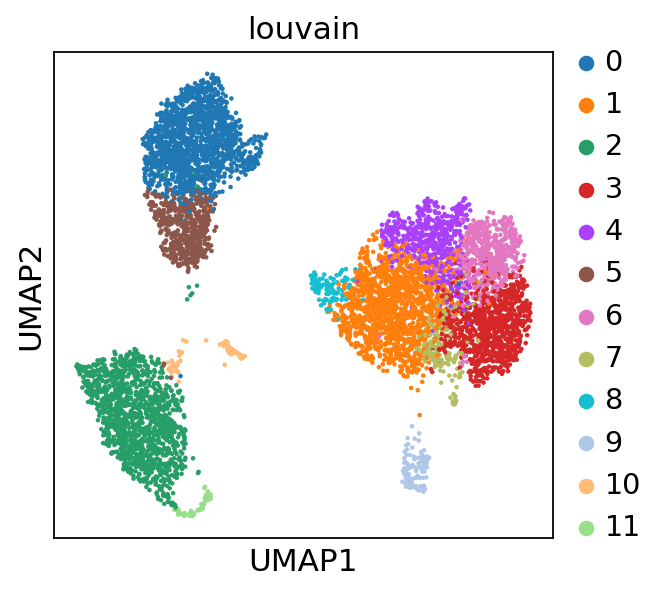

35008_CV005_RV9039261_and_35008_CV005_RV9039285


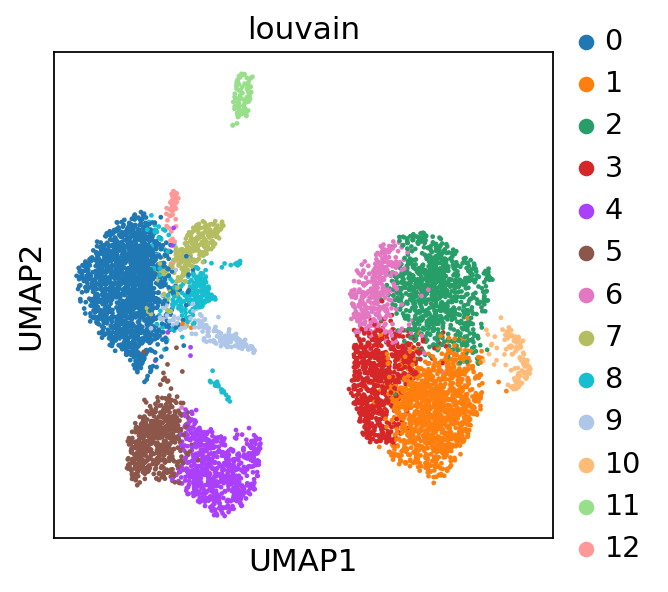

35008_CV005_RV9039262_and_35008_CV005_RV9039286


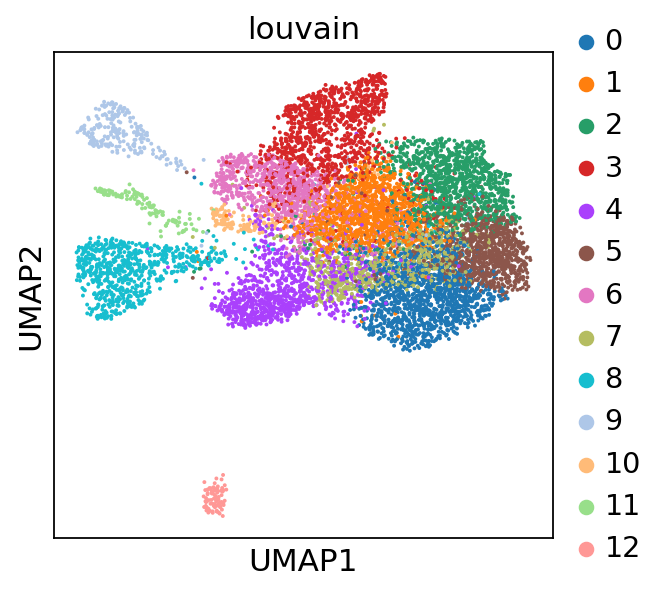

35008_CV005_RV9039263_and_35008_CV005_RV9039287


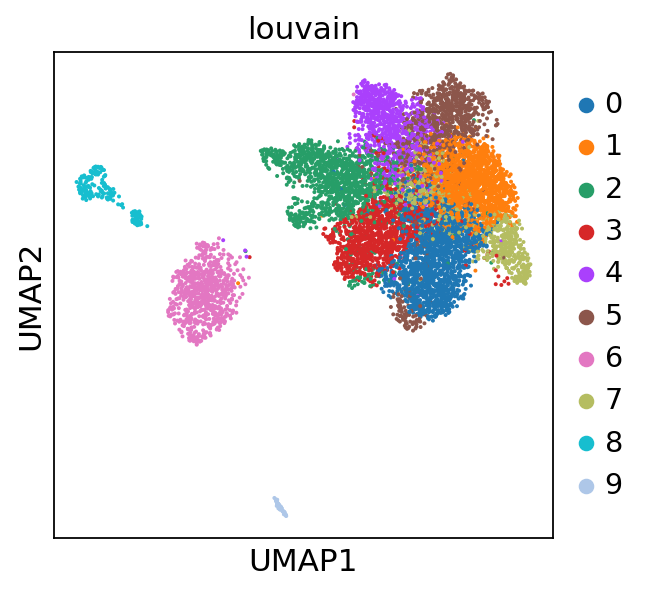

35171_CV005_RV9039361


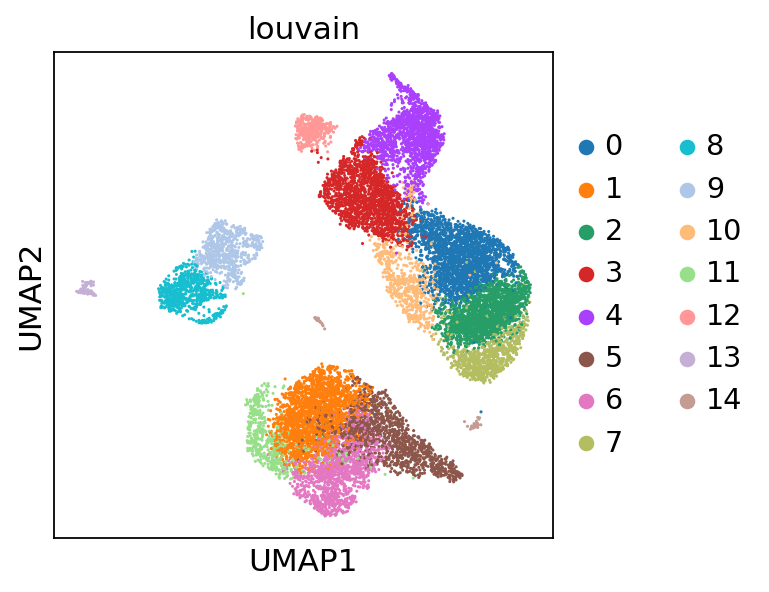

35171_CV005_RV9039362


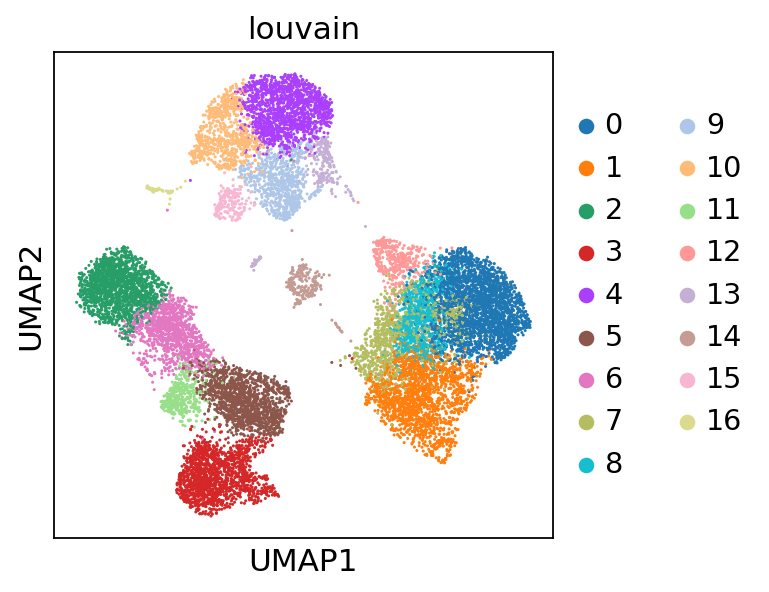

35171_CV005_RV9039363


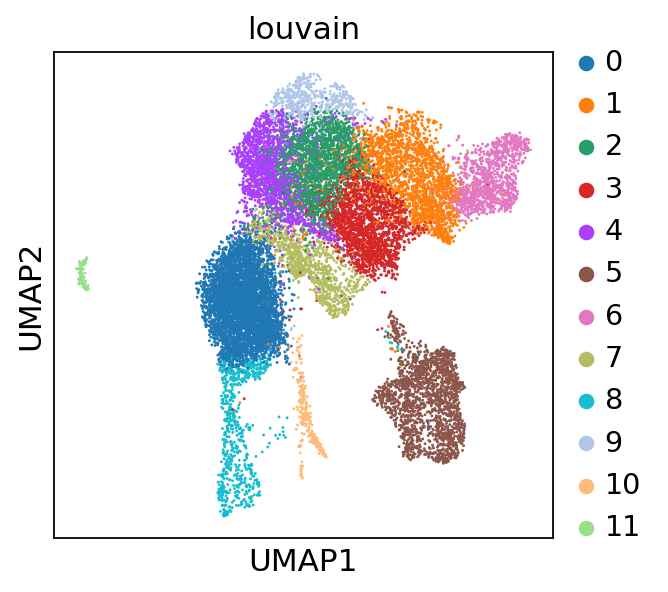

In [56]:
for sample in samples:
    print(sample)
    sc.pl.umap(adatas_hvg[sample], color=['louvain'])

In [57]:
# SAVING
for sample in samples:
    print(sample)
    adatas_hvg[sample].write(save_path+'adata_hvg_no_batch_correction_nodoublets_20_PCs_GEX_only_sample_'+sample+'_for_SoupX_new_20210211.h5ad')

35008_CV005_RV9039258_and_35008_CV005_RV9039282
35008_CV005_RV9039259_and_35008_CV005_RV9039283
35008_CV005_RV9039260_and_35008_CV005_RV9039284
35008_CV005_RV9039261_and_35008_CV005_RV9039285
35008_CV005_RV9039262_and_35008_CV005_RV9039286
35008_CV005_RV9039263_and_35008_CV005_RV9039287
35171_CV005_RV9039361
35171_CV005_RV9039362
35171_CV005_RV9039363


In [60]:
save_path

'/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/'

In [87]:
# READING
for sample in samples:
    print(sample)
    adatas_hvg[sample] = sc.read(save_path+'adata_hvg_no_batch_correction_nodoublets_20_PCs_GEX_only_sample_'+sample+'_for_SoupX.h5ad')


In [58]:
pd.DataFrame(adatas_hvg['35008_CV005_RV9039258_and_35008_CV005_RV9039282'].obs.loc[:,'louvain'])

,louvain
index,
AAACCTGAGAATGTGT-1,5
AAACCTGAGACTAAGT-1,7
AAACCTGAGCCGCCTA-1,1
AAACCTGAGCGCCTCA-1,0
AAACCTGAGGATGTAT-1,0
...,...
TTTGTCATCGTACCGG-1,1
TTTGTCATCGTTGCCT-1,3
TTTGTCATCTCAAGTG-1,7


In [59]:
# saving tables for SoupX
cluster_tables = {}

for sample in samples:
    print(sample)
    cluster_tables[sample] = pd.DataFrame(adatas_hvg[sample].obs.loc[:,'louvain'])
    cluster_tables[sample].to_csv(save_path + 'louvain_clusters_for_SoupX_sample_' + sample + '_new_20210211.csv')

35008_CV005_RV9039258_and_35008_CV005_RV9039282
35008_CV005_RV9039259_and_35008_CV005_RV9039283
35008_CV005_RV9039260_and_35008_CV005_RV9039284
35008_CV005_RV9039261_and_35008_CV005_RV9039285
35008_CV005_RV9039262_and_35008_CV005_RV9039286
35008_CV005_RV9039263_and_35008_CV005_RV9039287
35171_CV005_RV9039361
35171_CV005_RV9039362
35171_CV005_RV9039363
